In [10]:
import numpy as np
import random
import math
import pandas as pd
from os import walk, getcwd
from scipy.integrate import quad
from scipy.stats import kendalltau
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr


## RBO functions
For now I will just be looking at RBO_ext, and be plugging in multiple different lists of agreements, since that is the only value I will be changing.

In [31]:
# these methods do not handle lists with different prefixes
# redefining RBO_max and RBO_min is not possible through a constant agreement value, unless I force it to be?
# it will not necesarily be constant, which is rather problematic...
# 

## This is part one of the equation

def RBO_plain(p,A):
    res = 0
    k = len(A)
    for d in np.arange(1,k+1):
        res += A[d-1] * (p**d)
    
    return (1-p)*res/p

## This is part two of the equations, eventually


## here is part 3:

def RBO_min_CG_3(p,l,diff_at_l,diff_max_min):
    res = 0
    for d in np.arange(1,l+1):
        res+=(p**d)/d
    return (1-p)/p*(-diff_at_l+diff_max_min*l)/diff_max_min*(np.log(1/(1-p))-res)

def RBO_ext(p,A):
    k = len(A)
    res = RBO_plain(p,A)
        
    return A[k-1]*(p**k) + res

# for cosine similarity, the max function is pretty similar to the method in the paper, as it will also be able to pair 2 at a time and eventually converge to 1.
# min, however, is a bit more unclear. It will converge to 0 on a longer time, but its not great

In [3]:
def RBO_CG(L,S,mi,ma,p,max_score_normalisation=False): # in this case im dividing by the max score
    res = 0
    gap = ma-mi # difference between min and max
    
    if len(L)<len(S):
        aux = L
        L = S
        S = aux
    l = len(L)
    s = len(S)
    
    part_1 = 0 # corresponds to the first part of the formula
    
    CG_L = 0
    CG_S = 0
        
    for d in np.arange(1,s+1): # things are 1 indexed :(
        CG_L += L[d-1]
        CG_S += S[d-1]
        
        if CG_L == CG_S:
            part_1 += p**d
        else:
            if max_score_normalisation:
                part_1 += (1-np.abs(CG_L-CG_S)/(d*gap))*p**d
            else: 
                part_1 += (1-np.abs(CG_L-CG_S)/(np.max([CG_L,CG_S])))*p**d
    
    part_1 = (1-p)/p*part_1
        
    part_2_max = 0
    CG_L_max = CG_L
    CG_S_max = CG_S
    
    for d in np.arange(s+1,l+1):
        CG_L_max += L[d-1]
        
        diff = CG_L_max-CG_S_max
        
        if diff < mi:
            CG_S_max += mi
        elif diff > ma:
            CG_S_max += ma
        else: 
            CG_S_max = CG_L_max
            
        if CG_L_max == CG_S_max:
            part_2_max += p**d
        else:
            if max_score_normalisation:
                part_2_max += (1-np.abs(CG_L_max-CG_S_max)/(d*gap))*p**d
            else:
                part_2_max += (1-np.abs(CG_L_max-CG_S_max)/(np.max([CG_L_max,CG_S_max])))*p**d
            
    part_2_max = (1-p)/p*part_2_max
        
#     print("max p2: "+ str(part_2_max))
#     print("max p2 + p1: "+ str(part_2_max+part_1))
    
    part_3_max = 0
    
    d_max = l+1
    while np.abs(CG_S_max-CG_L_max)>gap:
        if CG_S_max>CG_L_max:
            CG_S_max+=mi
            CG_L_max+=ma
        else:
            CG_L_max+=mi
            CG_S_max+=ma
            
        if max_score_normalisation:
            part_3_max += (1-np.abs(CG_L_max-CG_S_max)/(d*gap))*p**d_max
        else:
            part_3_max += (1-np.abs(CG_L_max-CG_S_max)/(np.max([CG_L_max,CG_S_max])))*p**d_max
        d_max+=1
    
    part_3_max = (1-p)/p*part_3_max + p**(d_max-1) ## handles anything that comes after they are equal as well
    
    part_2_min = 0
    CG_L_min = CG_L
    CG_S_min = CG_S
    
    min_vals = {}
    min_vals[CG_S_min] = 0
    
    previous_min = part_1

    for d in np.arange(s+1,l+1):
        cutoff = (p**(d-1)+previous_min)*p/(1-p) # scale of p/(1-p) is necessary, otherwise we might cut off too much
        previous_min = 1
        CG_L_min += L[d-1]
        
        next_min_vals = {}
        
        for k in min_vals:
            for x in np.arange(mi,ma+1):
                CG_S_cur = k+x
                val_cur = min_vals[k]
                if CG_L_min == CG_S_cur:
                    val_cur += p**d
                else:
                    if max_score_normalisation:
                        val_cur += (1-np.abs(CG_L_min-CG_S_cur)/(d*gap))*p**d
                    else:
                        val_cur += (1-np.abs(CG_L_min-CG_S_cur)/(np.max([CG_L_min,CG_S_cur])))*p**d
                
                if val_cur > cutoff:
                    continue
                
                previous_min = np.min([previous_min,val_cur])
                
                if CG_S_cur in next_min_vals:
                    next_min_vals[CG_S_cur] = np.min([next_min_vals[CG_S_cur],val_cur])
                else:
                    next_min_vals[CG_S_cur] = val_cur
        
        min_vals = next_min_vals

    max_score_normalisation_sum = 0
    for d in np.arange(1,l+1):
        max_score_normalisation_sum += (p**d)/d
    
    min_res = 10000
        
    for k in min_vals:
        if max_score_normalisation:
            x_l = np.abs(CG_L_min - k)
            cur_score = (-x_l+gap*l)/gap*(np.log(1/(1-p))-max_score_normalisation_sum)+min_vals[k]
            
            if min_res > cur_score + cur_score:
                min_res = cur_score
            
        else:
            c_x = np.abs(CG_L_min - k) 
            c_y = np.max([k,CG_L_min])

            result, error = quad(min_integrand, 0, np.inf, args=(p, 1+c_y/gap))

            cur_score = (c_y-c_x)/gap*(p**(l+1))*result + min_vals[k]
            if min_res > cur_score:
                min_res = cur_score

    min_res = min_res*(1-p)/p            
    
    # I will first try to extrapolate based off of assuming similar gain... (probably won't work too well, since you'd expect most of the gain to be at the top, but oh well)
    
    CG_S_ext_1 = CG_S
    CG_L_ext_1 = CG_L
    
    part_2_ext_1 = 0
        
    for d in np.arange(s+1,l+1):
        CG_L_ext_1 += L[d-1]
        CG_S_ext_1 += CG_S/s
                
        if CG_L_ext_1 == CG_S_ext_1:
            part_2_ext_1 += p**d
        else:
            if max_score_normalisation:
                part_2_ext_1 += (1-np.abs(CG_L_ext_1-CG_S_ext_1)/(d*gap))*p**d
            else:
                part_2_ext_1 += (1-np.abs(CG_L_ext_1-CG_S_ext_1)/(np.max([CG_L_ext_1,CG_S_ext_1])))*p**d
            
    part_2_ext_1 = part_2_ext_1*(1-p)/p
    if CG_L_ext_1 == CG_S_ext_1:
        part_3_ext_1 = p**l
    else:
        if max_score_normalisation:
            part_3_ext_1 = (1-np.abs(CG_L_ext_1-CG_S_ext_1)/(d*gap))*p**l
        else:
            part_3_ext_1 = ((1-np.abs(CG_L_ext_1-CG_S_ext_1)/(np.max([CG_L_ext_1,CG_S_ext_1])))*p**l) # assumes the same agreement for the rest
    
    # we can also disregard the unseen part of CG_L and just assume same agreement throughout
    # this gives ext lower than RBO_min from time to time, so not the best idea
#     print(CG_L, CG_S)
    if CG_L == CG_S:
        part_3_ext_2 = p**s
    else:
        if max_score_normalisation:
            part_3_ext_2 = (1-np.abs(CG_L-CG_S)/(gap*d))*p**s
        else:
            part_3_ext_2 = ((1-np.abs(CG_L-CG_S)/(np.max([CG_L,CG_S]))))*p**s
    
    return {'RBO_base': part_1, 'RBO_absolute_max': part_1 + p**s, 'RBO_max': part_1 + part_2_max + part_3_max, 'RBO_min': part_1+min_res, 'RBO_ext_1': part_1+part_2_ext_1+part_3_ext_1, 'RBO_ext_2': part_1+part_3_ext_2}
        

def min_integrand(t, p, alpha):
    return np.exp(-alpha * t) / (1 - p * np.exp(-t))

    

In [4]:
# For now this only calculates base!!!
def RBO_CG_general(L,S,bins,p,max_score_normalisation=False):
    bins.sort()
    mi = bins[0]
    ma = bins[-1]
    res = 0
    gap = ma-mi # difference between min and max
    
    if len(L)<len(S):
        aux = L
        L = S
        S = aux
    l = len(L)
    s = len(S)
    
    part_1 = 0 # corresponds to the first part of the formula
    
    CG_L = 0
    CG_S = 0
        
    for d in np.arange(1,s+1): # things are 1 indexed :(
        CG_L += L[d-1]
        CG_S += S[d-1]
        
        if CG_L == CG_S:
            part_1 += p**d
        else:
            if max_score_normalisation:
                part_1 += (1-np.abs(CG_L-CG_S)/(d*gap))*p**d
            else: 
                part_1 += (1-np.abs(CG_L-CG_S)/(np.max([CG_L,CG_S])))*p**d
    
    part_1 = (1-p)/p*part_1
    
    return part_1

def flat_gain(L):
    res = []
    for x in L:
        if x == 0:
            res.append(0)
        else:
            res.append(1)
            
    return res

def steep_gain(L,values):
    res = []
    for x in L:
#         print(x)
        res.append(values[x])
    return res

In [32]:

####################################################################################################
# Copyright 2024 Julián Urbano <urbano.julian@gmail.com>                               MIT LICENSE #
#                                                                                                  #
# Permission is hereby granted, free of charge, to any person obtaining a copy of this software    #
# and associated documentation files (the "Software"), to deal in the Software without             #
# restriction, including without limitation the rights to use, copy, modify, merge, publish,       #
# distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the    #
# Software is furnished to do so, subject to the following conditions:                             #
#                                                                                                  #
# The above copyright notice and this permission notice shall be included in all copies or         #
# substantial portions of the Software.                                                            #
#                                                                                                  #
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING    #
# BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND       #
# NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM,     #
# DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,   #
# OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.          #
####################################################################################################
# Always check for the latest version at https://github.com/julian-urbano/sigir2024-rbo            #
#                                                                                                  #
# If you use this software, please cite the following paper:                                       #
#                                                                                                  #
# M. Corsi and J. Urbano, "The Treatment of Ties in Rank-Biased Overlap", International ACM SIGIR  #
# Conference on Research and Development in Information Retrieval, 2024.                           #
####################################################################################################

import re
import numpy as np

# Utility functions to create rankings #############################################################

def from_string(s):
  """
  Create a ranking from a string representation.
  
  Item names must use alphanumeric characters only. Items must be separated by a blank space, and
  tie groups must be enclosed in parentheses. For example: "red (blue green) yellow pink".
  """
  if not isinstance(s, str) or not re.match(r"^(\w+|\(\w+( \w+)+\))( (\w+|\(\w+( \w+)+\)))*$", s):
    raise ValueError("'s' must be a string representation of a ranking using alphanumeric characters")
  
  # separate letters, but retain ( and ) for groups
  g = re.split(' +', s)

  r = []  # to build up the output vector
  in_group = False  # to keep track of whether we're in a group or not

  for gg in g:
    if gg.startswith('(') or gg.endswith(')'):
      if in_group:
        # end of group
        gg = gg[:-1]
        r[-1].add(gg)
        in_group = False
      else:
        # beginning of group
        gg = gg[1:]
        r.append({gg})
        in_group = True
    else:
      if in_group:
        # tied, inner
        r[-1].add(gg)
      else:
        # untied
        r.append(gg)
  
  return r

def to_string(r):  
  """
  Create a string representation from a ranking.
  """
  return ' '.join([item if isinstance(item, str) else '('+' '.join(item)+')' for item in r]).strip()

def extract_ranking(items, scores):
  """
  Create a ranking of `items`, sorting by `scores` in descending order. Items with the same score
  will be grouped in a tie.
  This is useful for instance to extract the ranking of documents by their retrieval value.
  """
  # Sort by score first
  items = np.array(items)
  scores = np.array(scores)
  o = np.argsort(-scores)
  items = items[o]
  scores = scores[o]
  
  r = [items[0]] 
  prev = scores[0]  # Keep track of the previous score
  i = 1

  while i < len(scores):
    if scores[i] == prev:
      if isinstance(r[-1], str):
        r[-1] = {r[-1]}
      r[-1].add(items[i])
    else:
      r.append(items[i]) # new group
    prev = scores[i]
    i += 1

  return r

# RBO ##############################################################################################

def flatten(x, y = None):
  """
  Flatten rankings (with possible ties), returning:
    - `id`: flattened ranking.
    - `t`: top ranks.
    - `b`: bottom ranks.
  If both `x` and `y` are given, it returns a tuple identifying the Longer and Shorter rankings.
  """
  if y is not None:
    x = flatten(x)
    y = flatten(y)

    if len(x['id']) >= len(y['id']):
      return (y, x)
    else:
      return (x, y)
  else:
    ids = []
    t = []
    b = []

    r = -1  # last rank
    index = 0
    for g in x:
      if isinstance(g, str):
        ids.append(g)
        t.append(r+1)
        b.append(r+1)
        r += 1
      else:
        for gg in g:
          ids.append(gg)
          t.append(r+1)
          b.append(r+len(g))
        r += len(g)
        
  return {'id': np.array(ids), 't': np.array(t), 'b': np.array(b)}

def cc_w(S, L):
  """
  Compute w-variant item contributions of the flattened rankings S and L. Also returns the set
  `omega` with all items, used to index the rows of the contribution matrices.
  """
  omega = np.concatenate((S['id'], L['id'][~np.isin(L['id'], S['id'])])) # union of domains, keeping order
  return (cc_w_(S, omega, len(L['id'])), cc_w_(L, omega, len(L['id'])), omega)
def cc_w_(f, omega, max_d):   
  m = np.zeros((len(omega), max_d))
  for i in range(len(f['id'])):
    row = np.where(omega == f['id'][i])
    cols = np.arange(f['t'][i], max_d)
    m[row, cols] = 1
  return m

def cc_a(S, L):
  """
  Compute a/b-variant item contributions of the flattened rankings S and L. Also returns the set
  `omega` with all items, used to index the rows of the contribution matrices.
  """
  omega = np.concatenate((S['id'], L['id'][~np.isin(L['id'], S['id'])])) # union of domains, keeping order
  return (cc_a_(S, omega, len(L['id'])), cc_a_(L, omega, len(L['id'])), omega)
def cc_a_(f, omega, max_d):
  m = np.zeros((len(omega), max_d))
  for i in range(len(f['id'])):
    row = np.where(omega == f['id'][i])
    cols = np.arange(f['b'][i], max_d)
    m[row, cols] = 1
    cols = np.arange(f['t'][i], f['b'][i])
    m[row, cols] = np.arange(1, f['b'][i]-f['t'][i]+1) / (f['b'][i]-f['t'][i]+1)
  return m

def rbo(x, y, p, ties = 'a', score = ('ext', 'min', 'max', 'res')):
  """
  Compute RBO between `x` and `y`, with persistence parameter `p`, and handling ties when present.
  
  The rankings should be represented as a list of items, where ties are identified by a set, e.g.:
    ["red", {"blue", "green"}, "yellow", "pink"]
  Utility functions `from_string`, `to_string` and `extract_ranking` can ease the process of
  creating valid rankings from string representations or raw ranking data.
  
  Parameters
  ----------
  ties: 'a' (default), 'b' or 'w'
    Please see section 1.1 of the SIGIR 2024 paper to decide which one should be used. In summary:
      - When ties represent equality (i.e. sports rankings), use 'w'.
      - When ties represent uncertainty (i.e. don't know which items go first):
        - Use 'a' to compute the average RBO across permutations of the ties.
        - Use 'b' if the RBO score should be corrected by the information lost due to ties.
        
  score: tuple with any of 'ext', 'min', 'max' and 'res' (all by default)
    - 'ext': extrapolate the agreement in the seen part to the unseen part.
    - 'min': lower bound by assuming no additional overlap in the unseen part.
    - 'max': upper bound by assuming maximum overlap in the unseen part.
    - 'res': size of the residual, i.e. 'max'-'min'.
  """
  if not (0 < p < 1):
    raise ValueError("'p' must be between 0 and 1.")
  if not ties in ('w', 'a', 'b'):
    raise ValueError("'ties' must be one of 'w', 'a' or 'b'.")
  if not np.all(np.isin(score, ('ext', 'min', 'max', 'res'))):
    raise ValueError("'score' must be one or more of 'ext', 'min', 'max' or 'res'.")
  
  # Flat representations
  S, L = flatten(x, y)
  s = len(S['id'])
  l = len(L['id'])
  
  # If there are no ties, use w-variant for efficiency
  if(np.all(S['t']==S['b']) and np.all(L['t']==L['b'])):
    ties = 'w'
    
  # Calculate individual item contributions
  if ties == 'w':
    cS, cL, omega = cc_w(S, L)
  else:
    cS, cL, omega = cc_a(S, L)
  
  # First section: 1 to s
  d = np.arange(0, s)
  X1 = np.sum(cS[:, d] * cL[:, d], axis=0)
  if 'w' in ties:
    A1 = 2 * X1 / (np.sum(cS[:, d], axis=0) + np.sum(cL[:, d], axis=0))
  elif 'a' in ties:
    A1 = X1 / (d+1)
  else:
    A1 = X1 / np.sqrt(np.sum(cS[:, d] ** 2, axis=0)) / np.sqrt(np.sum(cL[:, d] ** 2, axis=0))

  # Second section: s+1 to l
  d = np.arange(s, l)
  X2_seen = np.sum(cS[:, d] * cL[:, d], axis=0)
  
  if 'min' in score or 'res' in score:
    X2_min = X2_seen
    if 'w' in ties:
      A2_min = 2 * X2_min / (d+1 + np.sum(cL[:, d], axis=0))
    elif 'a' in ties:
      A2_min = X2_min / (d+1)
    else:
      A2_min = X2_min / np.sqrt(d+1) / np.sqrt(np.sum(cL[:, d] ** 2, axis=0))

  if 'max' in score or 'res' in score:
    LdS = L['id'][~np.isin(L['id'], S['id'])] # uniques in L, keeping order
    cL_unseen_max = cL[np.isin(omega, LdS[d-s]),:][:,d]
    cL_unseen_max[np.tril_indices_from(cL_unseen_max, k=-1)] = np.nan
    X2_unseen_max = np.nansum(cL_unseen_max, axis=0)
    X2_max = X2_seen + X2_unseen_max
    if 'w' in ties:
      A2_max = 2 * X2_max / (d+1 + np.sum(cL[:, d], axis=0))
    elif 'a' in ties:
      A2_max = X2_max / (d+1)
    else:
      A2_max = X2_max / np.sqrt(d+1) / np.sqrt(np.sum(cL[:, d] ** 2, axis=0))
     
  if 'ext' in score:
    LdS = L['id'][~np.in1d(L['id'], S['id'])] # uniques in L, keeping order
    cL_unseen = cL[np.isin(omega, LdS),:][:,d]
    cL_unseen[cL_unseen == 0] = np.nan
    cL_unseen = np.nanmean(cL_unseen, axis=0)
    X2_unseen_ext = (d-s+1) * A1[s-1] * cL_unseen

    X2_ext = X2_seen + X2_unseen_ext
    if 'w' in ties:
      A2_ext = 2 * X2_ext / (d+1 + np.sum(cL[:, d], axis=0))
    elif 'a' in ties:
      A2_ext = X2_ext / (d+1)
    else:
      A2_ext = X2_ext / np.sqrt(d+1) / np.sqrt(np.sum(cL[:, d] ** 2, axis=0))

  # Third section: l+1 to inf
  X_seen = np.concatenate([X1, X2_seen])
  Xl = X_seen[l - 1]  # X_l
  if 'min' in score or 'res' in score:
    d = np.arange(1, l + 1)
    sec3_min = Xl * (np.log(1 / (1 - p)) - np.sum(p ** np.array(d) / np.array(d)))
  if 'max' in score or 'res' in score:
    f = l + s - Xl
    d = np.arange(l + 1, f + 1)
    sec3_max = np.sum((2 * np.array(d) - l - s + Xl) / np.array(d) * p ** np.array(d)) + p ** (f + 1) / (1 - p)
  if 'ext' in score:
    sec3_ext = (Xl + (l - s) * A1[s - 1]) / l * p ** (l + 1) / (1 - p)

  # All sections
  d = np.arange(1, l + 1)
  if 'min' in score or 'res' in score:
    rbo_min = (1 - p) / p * (np.sum(np.concatenate([A1, A2_min]) * p ** np.array(d)) + sec3_min)
  if 'max' in score or 'res' in score:
    rbo_max = (1 - p) / p * (np.sum(np.concatenate([A1, A2_max]) * p ** np.array(d)) + sec3_max)
  if 'ext' in score:
    rbo_ext = (1 - p) / p * (np.sum(np.concatenate([A1, A2_ext]) * p ** np.array(d)) + sec3_ext)
  
  # Output
  r = {}
  if 'ext' in score:
    r['ext'] = rbo_ext
  if 'min' in score:
    r['min'] = rbo_min
  if 'max' in score:
    r['max'] = rbo_max
  if 'res' in score:
    r['res'] = rbo_max - rbo_min
  
  return r


In [36]:
# print(RBO_ext(random.random(),[1,1,1,1]))
# assert math.isclose(RBO_ext(random.random(),[1,1,1,1]), 1.0, abs_tol=1e-8)
for d in np.arange(1,50):
    print(RBO_min_CG_3(.9,d,d*3-1,3))
# print(RBO_min_CG_3(.9,1,0,3))
# print(RBO_min_CG_3(.9,2,0,3))
# assert math.isclose(RBO_min_CG_3(.9,1,3,3), 0, abs_tol=1e-8)

0.05194759603681651
0.0369475960368165
0.0279475960368165
0.021872596036816495
0.017498596036816496
0.014218096036816494
0.011687424608245067
0.009694520858245069
0.008100197858245065
0.006808796228245071
0.005752194894608701
0.0048804987943587
0.004156320495689475
0.0035511143460873382
0.0030427411804215443
0.002613801321891032
0.002250464029959299
0.0019416273318173275
0.0016783034102436476
0.0014531614572981487
0.0012601826404877187
0.0010943962933187554
0.0009516758727124284
0.0008285795099394691
0.000722224252503641
0.0006301860489534108
0.0005504196058765315
0.0004811937284919592
0.0004210388281439886
0.0003687040648412491
0.00032312217422273776
0.0002833804633397305
0.0002486967883872781
0.0002183995782082269
0.00019191116016597032
0.0001687337943789999
0.00014843793893311357
0.00013065236034499932
0.00011505577604466031
0.00010136977332110396
8.935279531994295e-05
7.879502179034093e-05
6.951400226896786e-05
6.135092373541031e-05
5.416741462588097e-05
4.784280334465169e-05
4.227

## Agreement functions

For now I will just assume finite equi-length lists. I will most likely have to adapt the agreement to handle the cases for non-equi-length rankings, as well as for the min and max rankings

I have implemented the following agreement functions:
* CG
* DCG
* Cosine similarity

I still plan to implement the following agreement functions:
* EDM

I don't think it makes sense to try to implement nDCG, since it relies on the whole vector being known, which isn't really the case for our purposes

In [95]:
# this method does not do any data sanitisation!!!
# it assumes equal length rankings, and that the relevance bins are correct
# CG is done as described by https://www-sciencedirect-com.tudelft.idm.oclc.org/science/article/pii/S0306457305000075?via%3Dihub
# The only modification is that I normalise by dividing by the maximum difference at that depth
def CG_agreement(S,T,relevance_values):
    res = []
    S_cg = 0
    T_cg = 0
    
    max_bin = np.max(relevance_values)
    min_bin = np.min(relevance_values)
    
    for i in np.arange(0,len(S)):
        S_cg += S[i]
        T_cg += T[i]
        res.append(1-(abs(S_cg-T_cg))/((max_bin-min_bin)*(i+1))) # should I also substract min?
                    
    return res


# I don't think this scheme makes a lot of sense, since RBO is basically also doing it, so it seems kind of double
def DCG_agreement(S,T,relevance_values,b=2):
    res = []
    S_dcg = 0
    T_dcg = 0
    max_dcg = 0
    min_dcg = 0
    
    max_bin = np.max(relevance_values)
    min_bin = np.min(relevance_values)
    
    for i in np.arange(0,len(S)):
        if i<b:
            S_dcg += S[i]
            T_dcg += T[i]
            max_dcg += max_bin
            min_dcg += min_bin
        else:
            S_dcg += S[i]/(math.log(i+1,b))
            T_dcg += T[i]/(math.log(i+1,b))
            max_dcg += max_bin/(math.log(i+1,b))
            min_dcg += min_bin/(math.log(i+1,b))
        res.append(1-(abs(S_dcg-T_dcg))/(max_dcg-min_dcg)) # this could again be not propperly done, but I think its fine
        
    return res

# This is my own idea, it does not take into account any information about some relevance scores being closer than others
def cosine_agreement(S,T,relevance_values):
    res = []
    relevance_map = {}
    
    bins_T = []
    bins_S = []
    
    for i in np.arange(0,len(relevance_values)):
        bins_T.append(0)
        bins_S.append(0)
        relevance_map[relevance_values[i]] = i
        
    for i in np.arange(0,len(S)):
        bins_T[relevance_map[T[i]]]+=1 
        bins_S[relevance_map[S[i]]]+=1
        res.append(cosine_sim(bins_T,bins_S))
    
        
    return res
    
def cosine_sim(x,y):
    res = 0
    x_sum = 0
    y_sum = 0
    for i in np.arange(0,len(x)):
        res+=x[i]*y[i]
        x_sum += x[i]**2
        y_sum += y[i]**2
    return res/(np.sqrt(x_sum)*np.sqrt(y_sum))

In [66]:
data = [3,2,3,0,0,1,2,2,3,0]
# for x in np.arange(0,10):
#     data.append(random.randint(0,3))
# print(data)
data_copy = data.copy()
data_copy.reverse()
print(CG_agreement(data,data,[0,1,2,3]))
print(CG_agreement(data,data_copy,[0,1,2,3]))
# assert math.isclose(CG_agreement(data,data,[0,1,2,3]), [1.0]*10, abs_tol=1e-8)

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[0.0, 0.6666666666666667, 0.6666666666666667, 0.9166666666666666, 1.0, 0.9444444444444444, 0.8571428571428572, 0.9166666666666666, 0.8888888888888888, 1.0]


In [65]:
data = [3,2,3,0,0,1,2,2,3,0]
print(DCG_agreement(data,data,[0,1,2,3])) # DCG values correspond to paper
data_copy = data.copy()
data_copy.reverse()
print(DCG_agreement(data,data_copy,[0,1,2,3]))



[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[0.0, 0.6666666666666667, 0.6666666666666666, 0.8263636382865662, 0.8876674277021414, 0.866014736808432, 0.8219358394284655, 0.8586900103120554, 0.8464608684162958, 0.9125471263809791]


In [96]:
cosine_agreement(data,data,[0,1,2,3])

[1.0,
 0.9999999999999998,
 0.9999999999999998,
 1.0000000000000002,
 1.0,
 0.9999999999999998,
 1.0000000000000002,
 1.0000000000000002,
 1.0000000000000002,
 0.9999999999999999]

## Metric evaluation

In [100]:
# data = [3,2,3,0,0,1,2,2,3,0]
data = [3,3,3,2,3,3,2,0,2,2,1,3,0,0,0,2,1,2,3,3,0,2,0,0,2,1,0,3,0,3,0,0,2,1,1,3,2,0,0,3,3,0,0,2,2,2,0,1,3,3,0,0,0,0,1,3,1,1,3,3,2,0,2,1,0,0,3,2,3,0,1,0,1,0,2,1,2,0,3,2,1,1,1,0,0,0,0,2,3,2,2,0,1,3,2,2,2,1,0,3]
data2 = [3,3,2,3,1,1,0,1,0,3,3,2,1,1,3,3,0,2,3,0,1,0,2,0,3,1,2,1,1,2,3,2,2,1,0,2,1,1,3,1,2,0,3,3,2,2,3,0,3,3,2,1,0,0,0,0,1,0,0,0,2,0,3,2,0,0,2,2,0,3,1,1,1,0,0,0,1,0,2,2,1,3,0,2,2,0,0,0,3,0,1,0,3,0,0,0,2,0,3,0]
# data2 = [3,2,3,0,0,1,2,2,3,0]
# data2.reverse()
# data_reversed = data.copy()
# data_reversed.reverse()

A_CG = CG_agreement(data,data2,[0,1,2,3])
A_DCG = DCG_agreement(data,data2,[0,1,2,3])
A_cosine = cosine_agreement(data,data2,[0,1,2,3])


print(RBO_ext(.9,A_CG))
print(RBO_ext(.9,A_DCG))
print(RBO_ext(.9,A_cosine))
    




0.9073144119177806
0.9241161568462799
0.8900158904807252


## Edit trec-data format


In [87]:
from os import walk, getcwd
years = ["2010","2011","2012","2013","2014"]

for y in years:
    df = pd.read_csv('trec-data/rel/'+y+'.csv')
    index_data = list(zip(df['topic'], df['doc']))
    f = []
    for (dirpath, dirnames, filenames) in walk(getcwd()+"/trec-data/runs/"+y):
        f.extend(filenames)
        break
    for file in f:
        print('trec-data/runs/'+y+'/'+file)
        df_run = pd.read_csv('trec-data/runs/'+y+'/'+file)

        thisset = set()
        # print(df['doc']) 
        relevance_matched = []
        for x in zip(df_run['topic'], df_run['doc']):
            try:
                cur_index = index_data.index(x)
                relevance_matched.append(df['rel'][cur_index])
            except:
                relevance_matched.append(0)
        df_run['rel'] = relevance_matched
        df_run.to_csv('trec-data/runs/'+y+'/'+file, index=False)
# print(df_run)

trec-data/runs/2010/blv79y00prob.csv
trec-data/runs/2010/blv79y00shnk.csv
trec-data/runs/2010/cmuBase10.csv
trec-data/runs/2010/cmuFuTop10.csv
trec-data/runs/2010/cmuWiki10.csv
trec-data/runs/2010/DFalah2010.csv
trec-data/runs/2010/ICTNETAD10R1.csv
trec-data/runs/2010/ICTNETAD10R2.csv
trec-data/runs/2010/ICTNETAD10R3.csv
trec-data/runs/2010/irra10b.csv
trec-data/runs/2010/irra10hp.csv
trec-data/runs/2010/irra10rob.csv
trec-data/runs/2010/IvoryBM25a.csv
trec-data/runs/2010/IvoryL2Rb.csv
trec-data/runs/2010/IvoryLCEb.csv
trec-data/runs/2010/IvorySDa.csv
trec-data/runs/2010/IvoryWSDa.csv
trec-data/runs/2010/IvoryWSDb.csv
trec-data/runs/2010/MF1.csv
trec-data/runs/2010/MF2.csv
trec-data/runs/2010/MMCIl410m1.csv
trec-data/runs/2010/MMCITLCLl20M.csv
trec-data/runs/2010/MMCITLl20M.csv
trec-data/runs/2010/msrsv1.csv
trec-data/runs/2010/msrsv2.csv
trec-data/runs/2010/msrsv3.csv
trec-data/runs/2010/pkusewm1.csv
trec-data/runs/2010/sztaki1.csv
trec-data/runs/2010/THUIR10Qa.csv
trec-data/runs/2010

In [99]:
from os import walk, getcwd
years = ["2010","2011","2012","2013","2014"]

for y in years:
    f = []
    for (dirpath, dirnames, filenames) in walk(getcwd()+"/trec-data/runs/"+y):
        f.extend(filenames)
        break
    for file in f:
        df = pd.read_csv('trec-data/runs/'+y+'/'+file)
        df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
        df.to_csv('trec-data/runs/'+y+'/'+file, index=False)

# Tests with TREC data

In [389]:
df_1 = pd.read_csv('trec-data/runs/2014/CiirAll1.csv')
df_2 = pd.read_csv('trec-data/runs/2014/webisWt14axAll.csv')

for topic in np.arange(251,301):
    L = df_1[df_1['topic'] == topic]
    S = df_2[df_2['topic'] == topic]
        
    print(RBO_CG(L['rel'].tolist()[:100],S['rel'].tolist()[:50],0,3,.959))

31 50
{'RBO_base': 0.6683908874349388, 'RBO_absolute_max': 0.7916815988408477, 'RBO_max': 0.7586446307024609, 'RBO_min': 0.7122341581766284, 'RBO_ext_1': 0.7316138381366477, 'RBO_ext_2': 0.7448311285066023}
17 50
{'RBO_base': 0.5047078926199733, 'RBO_absolute_max': 0.6279986040258821, 'RBO_max': 0.5634112001443681, 'RBO_min': 0.5298023793309914, 'RBO_ext_1': 0.5418953681604602, 'RBO_ext_2': 0.5466267344979823}
58 44
{'RBO_base': 0.6392522855373352, 'RBO_absolute_max': 0.762542996943244, 'RBO_max': 0.7595267478662215, 'RBO_min': 0.7106483478227466, 'RBO_ext_1': 0.7420969207044184, 'RBO_ext_2': 0.7327831700521625}
30 44
{'RBO_base': 0.6033564805820358, 'RBO_absolute_max': 0.7266471919879447, 'RBO_max': 0.7128512165378865, 'RBO_min': 0.6556736135347604, 'RBO_ext_1': 0.6854705573697298, 'RBO_ext_2': 0.6874183292678828}
0 0
{'RBO_base': 0.8767092885940908, 'RBO_absolute_max': 0.9999999999999997, 'RBO_max': 0.9999999999999997, 'RBO_min': 0.8767092885940908, 'RBO_ext_1': 0.9999999999999997, '

0 1
{'RBO_base': 0.8415038506596791, 'RBO_absolute_max': 0.964794562065588, 'RBO_max': 0.8567044501786543, 'RBO_min': 0.8415038506596791, 'RBO_ext_1': 0.8415038506596791, 'RBO_ext_2': 0.8415038506596791}
24 55
{'RBO_base': 0.5315995922965059, 'RBO_absolute_max': 0.6548903037024147, 'RBO_max': 0.6005989787627486, 'RBO_min': 0.5643563472364788, 'RBO_ext_1': 0.5772772833582013, 'RBO_ext_2': 0.585399175455448}
2 24
{'RBO_base': 0.285812239641086, 'RBO_absolute_max': 0.40910295104699484, 'RBO_max': 0.31327079981777217, 'RBO_min': 0.2907577725909692, 'RBO_ext_1': 0.29704605975250076, 'RBO_ext_2': 0.2960864655915784}
22 59
{'RBO_base': 0.43600407408874026, 'RBO_absolute_max': 0.5592947854946492, 'RBO_max': 0.5181376792083869, 'RBO_min': 0.4764895329901814, 'RBO_ext_1': 0.49417091486915277, 'RBO_ext_2': 0.4819768817316215}
13 28
{'RBO_base': 0.48196939528901056, 'RBO_absolute_max': 0.6052601066949195, 'RBO_max': 0.5540284934781328, 'RBO_min': 0.5074752034394517, 'RBO_ext_1': 0.5297456634571819

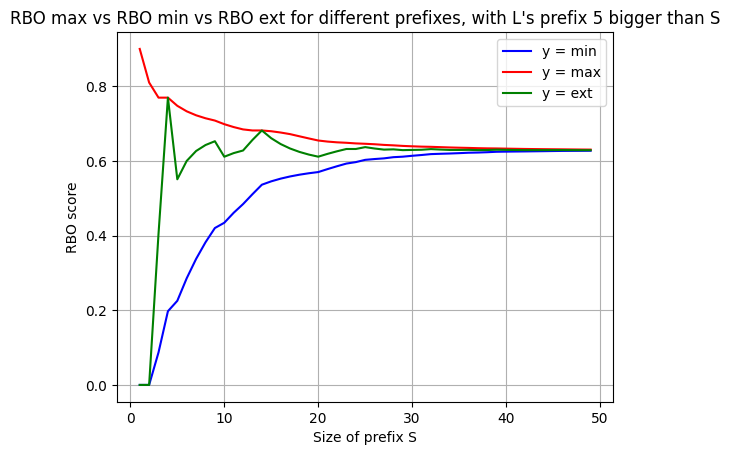

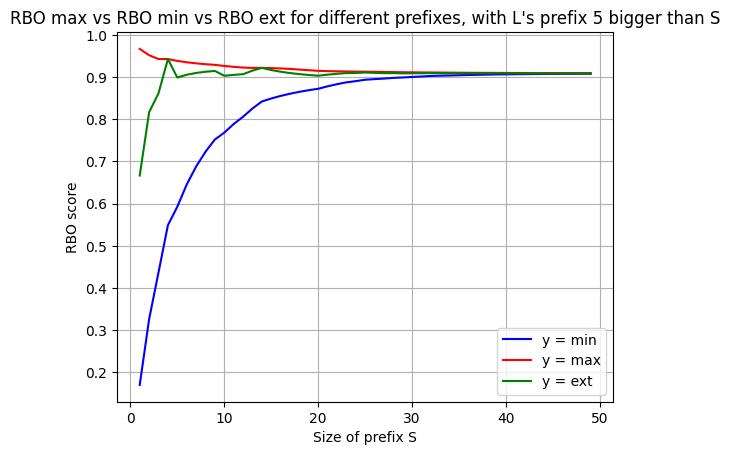

In [25]:
df_1 = pd.read_csv('trec-data/runs/2014/CiirAll1.csv')
df_2 = pd.read_csv('trec-data/runs/2014/webisWt14axAll.csv')

for version in np.arange(0,2):

    L = df_1[df_1['topic'] == 259]
    S = df_2[df_2['topic'] == 259]

    mins = []
    ext_1 = []
    ext_2 = []
    maxs = []

    for x in np.arange(1,50):
        res = RBO_CG(L['rel'].tolist()[:x],S['rel'].tolist()[:x],0,3,.9,version==1)
    #     res = RBO_CG([0],[0],0,3,.8)
    #     print(res)
        mins.append(res['RBO_min'])
        ext_1.append(res['RBO_ext_1'])
    #     ext_2.append(res['RBO_ext_2'])
        maxs.append(res['RBO_max'])

    x = np.arange(1,50)

    plt.plot(x, mins, label='y = min', color='blue', linestyle='-')
    plt.plot(x, maxs, label='y = max', color='red', linestyle='-')
    plt.plot(x, ext_1, label='y = ext', color='green', linestyle='-')
    # plt.plot(x, ext_2, label='y = ext_2', color='yellow', linestyle='-')

    plt.xlabel('Size of prefix S')
    plt.ylabel('RBO score')
    plt.title('RBO max vs RBO min vs RBO ext for different prefixes, with L\'s prefix 5 bigger than S')
    plt.legend()

    plt.grid(True)
    plt.show()

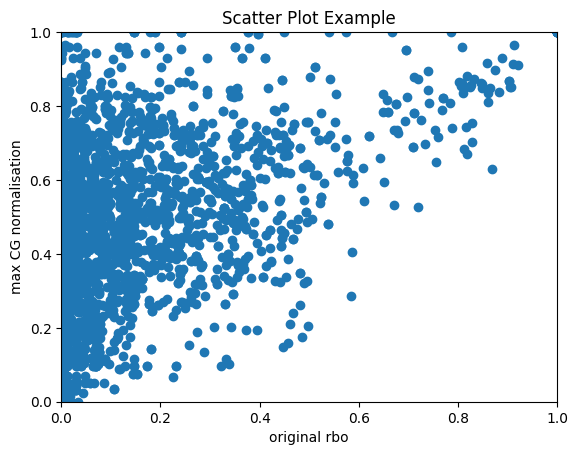

C:\Users\Thijs\AppData\Local\Temp\ipykernel_26352\119113770.py:48: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin' will be ignored
  plt.scatter(rbo3, rbo2, vmin=0)


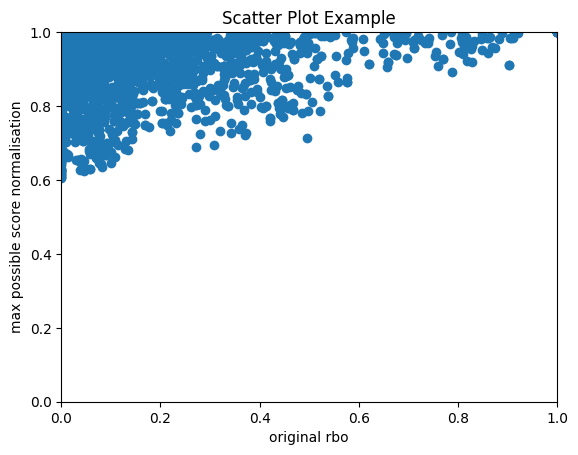

RBO between res_1 and res_2 with p=0.95: {'ext': 0.9961612290602222, 'min': 0.9961612290602222, 'max': 0.9961612290602222, 'res': 0.0}
RBO between res_1 and res_3 with p=0.95: {'ext': 0.06752440496001386, 'min': 0.06752440496001386, 'max': 0.06752440496001386, 'res': 0.0}
RBO between res_2 and res_3 with p=0.95: {'ext': 0.06627322513298442, 'min': 0.06627322513298442, 'max': 0.06627322513298442, 'res': 0.0}
RBO between res_1 and res_2 with p=0.9: {'ext': 0.9998742818794275, 'min': 0.9998742818794275, 'max': 0.9998742818794275, 'res': 0.0}
RBO between res_1 and res_3 with p=0.9: {'ext': 0.022559307097011715, 'min': 0.022559307097011715, 'max': 0.022559307097011715, 'res': 0.0}
RBO between res_2 and res_3 with p=0.9: {'ext': 0.022531473809502687, 'min': 0.022531473809502687, 'max': 0.022531473809502687, 'res': 0.0}
RBO between res_1 and res_2 with p=0.85: {'ext': 0.9999966278480463, 'min': 0.9999966278480463, 'max': 0.9999966278480463, 'res': 0.0}
RBO between res_1 and res_3 with p=0.85:

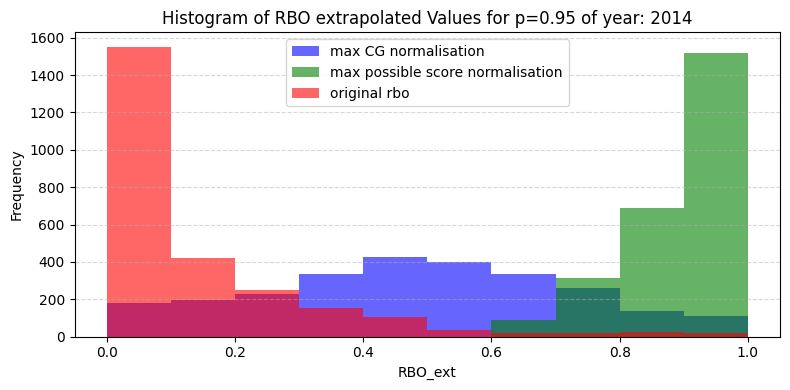

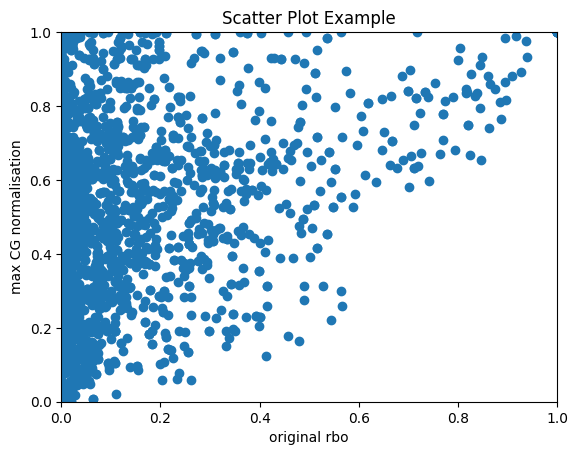

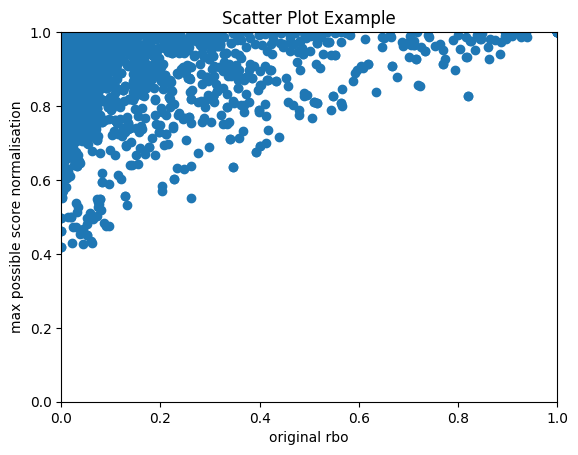

RBO between res_1 and res_2 with p=0.95: {'ext': 0.9990100990476249, 'min': 0.9990100990476249, 'max': 0.9990100990476249, 'res': 0.0}
RBO between res_1 and res_3 with p=0.95: {'ext': 0.07317415793346947, 'min': 0.07317415793346947, 'max': 0.07317415793346947, 'res': 0.0}
RBO between res_2 and res_3 with p=0.95: {'ext': 0.0731189900089433, 'min': 0.0731189900089433, 'max': 0.0731189900089433, 'res': 0.0}
RBO between res_1 and res_2 with p=0.9: {'ext': 0.9999748876889446, 'min': 0.9999748876889446, 'max': 0.9999748876889446, 'res': 0.0}
RBO between res_1 and res_3 with p=0.9: {'ext': 0.03130214433703047, 'min': 0.03130214433703047, 'max': 0.03130214433703047, 'res': 0.0}
RBO between res_2 and res_3 with p=0.9: {'ext': 0.031302014093054976, 'min': 0.031302014093054976, 'max': 0.031302014093054976, 'res': 0.0}
RBO between res_1 and res_2 with p=0.85: {'ext': 0.9999994710435299, 'min': 0.9999994710435299, 'max': 0.9999994710435299, 'res': 0.0}
RBO between res_1 and res_3 with p=0.85: {'ext

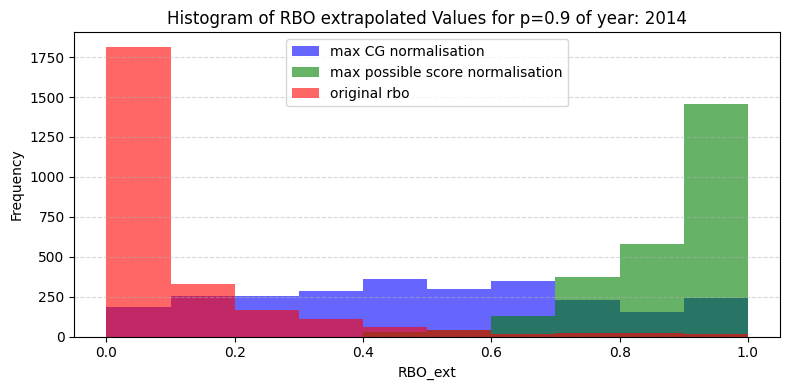

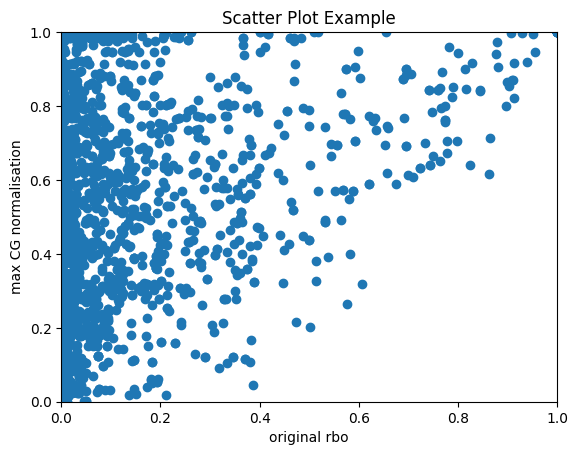

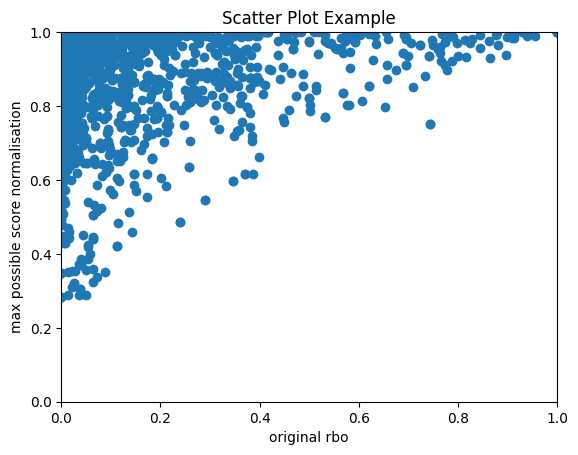

RBO between res_1 and res_2 with p=0.95: {'ext': 0.9992782015450057, 'min': 0.9992782015450057, 'max': 0.9992782015450057, 'res': 0.0}
RBO between res_1 and res_3 with p=0.95: {'ext': 0.07250627514027756, 'min': 0.07250627514027756, 'max': 0.07250627514027756, 'res': 0.0}
RBO between res_2 and res_3 with p=0.95: {'ext': 0.07251483339176218, 'min': 0.07251483339176218, 'max': 0.07251483339176218, 'res': 0.0}
RBO between res_1 and res_2 with p=0.9: {'ext': 0.9999800671322111, 'min': 0.9999800671322111, 'max': 0.9999800671322111, 'res': 0.0}
RBO between res_1 and res_3 with p=0.9: {'ext': 0.03127091900411607, 'min': 0.03127091900411607, 'max': 0.03127091900411607, 'res': 0.0}
RBO between res_2 and res_3 with p=0.9: {'ext': 0.031270962161986326, 'min': 0.031270962161986326, 'max': 0.031270962161986326, 'res': 0.0}
RBO between res_1 and res_2 with p=0.85: {'ext': 0.9999995524169225, 'min': 0.9999995524169225, 'max': 0.9999995524169225, 'res': 0.0}
RBO between res_1 and res_3 with p=0.85: {'

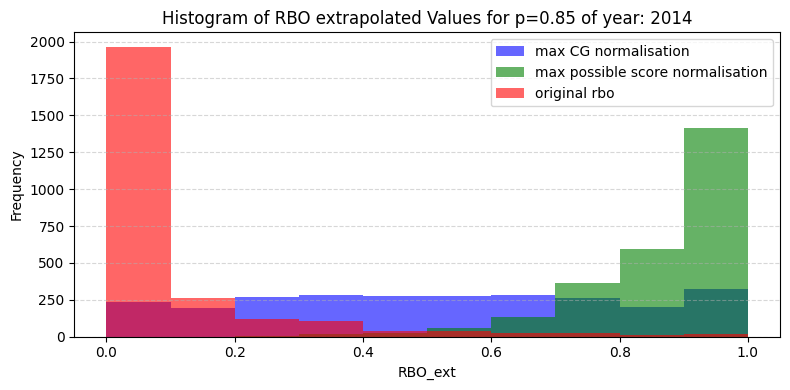

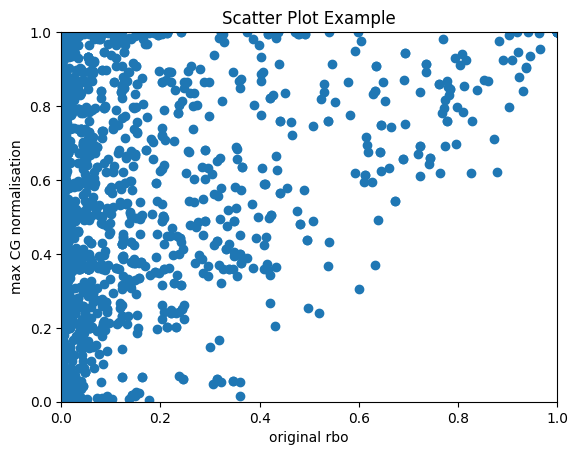

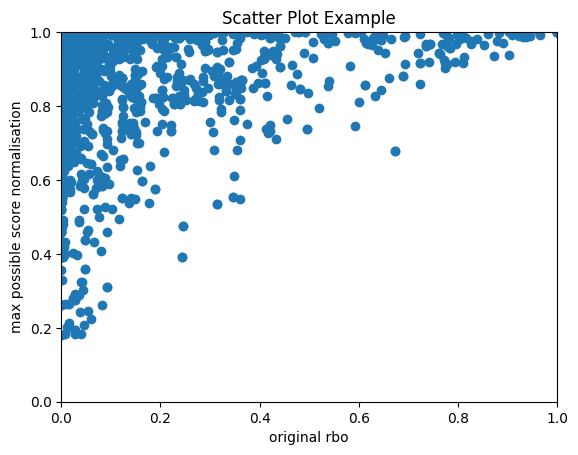

RBO between res_1 and res_2 with p=0.95: {'ext': 0.9995855416232545, 'min': 0.9995855416232545, 'max': 0.9995855416232545, 'res': 0.0}
RBO between res_1 and res_3 with p=0.95: {'ext': 0.07232508613710102, 'min': 0.07232508613710102, 'max': 0.07232508613710102, 'res': 0.0}
RBO between res_2 and res_3 with p=0.95: {'ext': 0.07232899017763277, 'min': 0.07232899017763277, 'max': 0.07232899017763277, 'res': 0.0}
RBO between res_1 and res_2 with p=0.9: {'ext': 0.9999893062429271, 'min': 0.9999893062429271, 'max': 0.9999893062429271, 'res': 0.0}
RBO between res_1 and res_3 with p=0.9: {'ext': 0.031267904042187704, 'min': 0.031267904042187704, 'max': 0.031267904042187704, 'res': 0.0}
RBO between res_2 and res_3 with p=0.9: {'ext': 0.03126791387369701, 'min': 0.03126791387369701, 'max': 0.03126791387369701, 'res': 0.0}
RBO between res_1 and res_2 with p=0.85: {'ext': 0.999999728551293, 'min': 0.999999728551293, 'max': 0.999999728551293, 'res': 0.0}
RBO between res_1 and res_3 with p=0.85: {'ext

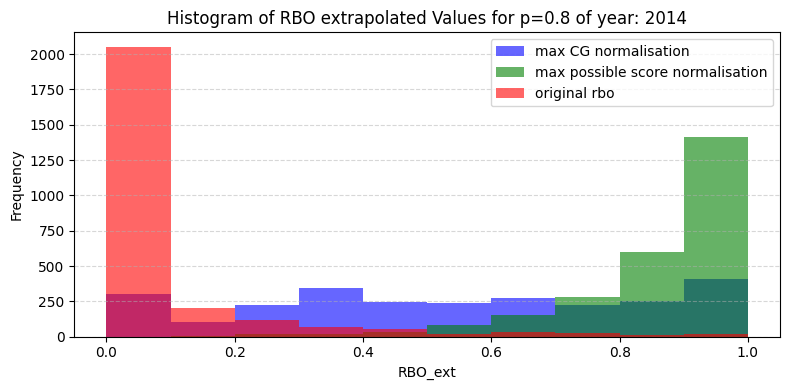

In [92]:
years = ["2010","2011","2012","2013","2014"]
p_values = [.95,.9,.85,.8]
for year_index in np.arange(4,len(years)):
    y = years[year_index]
    f = []
    for (dirpath, dirnames, filenames) in walk(getcwd()+"/trec-data/runs/"+y):
        f.extend(filenames)
        break

    dfs = []
    for file in f:
        dfs.append(pd.read_csv('trec-data/runs/'+y+'/'+file))
    for p in p_values:
        res_1 = []
        res_2 = []
        res_3 = []

        for i in np.arange(0,len(dfs)):
            for j in np.arange(i+1,len(dfs)):
                for t in np.arange((year_index+1)*50+20,(year_index+1)*50+26):
#                     print(i, j,t)
#                     print()
#                     print(dfs[i])
#                     print(dfs[i][dfs[i]['topic']==t])
                    res_1.append({'id':str(i)+'.'+str(j)+'.'+str(t),'data':RBO_CG(dfs[i][dfs[i]['topic']==t]['rel'].tolist()[:100],dfs[j][dfs[j]['topic']==t]['rel'].tolist()[:100],0,3,p,False)})
                    res_2.append({'id':str(i)+'.'+str(j)+'.'+str(t),'data':RBO_CG(dfs[i][dfs[i]['topic']==t]['rel'].tolist()[:100],dfs[j][dfs[j]['topic']==t]['rel'].tolist()[:100],0,3,p,True)})
                    res_3.append({'id':str(i)+'.'+str(j)+'.'+str(t),'data':rbo(dfs[i][dfs[i]['topic']==t]['doc'].tolist()[:100],dfs[j][dfs[j]['topic']==t]['doc'].tolist()[:100],p,score = ('ext'))})

        rbo1 = [d['data']['RBO_ext_1'] for d in res_1]
        rbo2 = [d['data']['RBO_ext_1'] for d in res_2]
        rbo3 = [d['data']['ext'] for d in res_3]
            
        plt.xlim(0, 1)
        plt.ylim(0, 1)

        plt.scatter(rbo3, rbo1)

        plt.xlabel('original rbo')
        plt.ylabel('max CG normalisation')
        plt.title('Scatter Plot Example')
        
        plt.show()
        
        
        plt.xlim(0, 1)
        plt.ylim(0, 1)
        
        plt.scatter(rbo3, rbo2, vmin=0)
        plt.xlabel('original rbo')
        plt.ylabel('max possible score normalisation')
        plt.title('Scatter Plot Example')

        plt.show()
        
        res_1 = sorted(res_1, key=lambda x: x['data']['RBO_ext_1'], reverse=True)
        res_2 = sorted(res_2, key=lambda x: x['data']['RBO_ext_1'], reverse=True)
        res_3 = sorted(res_3, key=lambda x: x['data']['ext'], reverse=True)
        
        for p2 in p_values:
            print("RBO between res_1 and res_2 with p="+str(p2)+":",rbo([item['id'] for item in res_1],[item['id'] for item in res_2],p2))
            print("RBO between res_1 and res_3 with p="+str(p2)+":",rbo([item['id'] for item in res_1],[item['id'] for item in res_3],p2))
            print("RBO between res_2 and res_3 with p="+str(p2)+":",rbo([item['id'] for item in res_2],[item['id'] for item in res_3],p2))
        
        print("tau between res_1 and res_2:",kendalltau([item['id'] for item in res_1],[item['id'] for item in res_2]))
        print("tau between res_1 and res_3:",kendalltau([item['id'] for item in res_1],[item['id'] for item in res_3]))
        print("tau between res_2 and res_3:",kendalltau([item['id'] for item in res_2],[item['id'] for item in res_3]))
        
        rbo1 = [d['data']['RBO_ext_1'] for d in res_1]
        rbo2 = [d['data']['RBO_ext_1'] for d in res_2]
        rbo3 = [d['data']['ext'] for d in res_3]

        plt.figure(figsize=(8, 4))
        plt.hist(rbo1, bins=10, range=(0, 1), alpha=0.6, label='max CG normalisation', color='blue')
        plt.hist(rbo2, bins=10, range=(0, 1), alpha=0.6, label='max possible score normalisation', color='green')
        plt.hist(rbo3, bins=10, range=(0, 1), alpha=0.6, label='original rbo', color='red')

        plt.xlabel('RBO_ext')
        plt.ylabel('Frequency')
        plt.title('Histogram of RBO extrapolated Values for p=' +str(p)+' of year: '+ y)
        plt.legend()
        plt.grid(axis='y', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

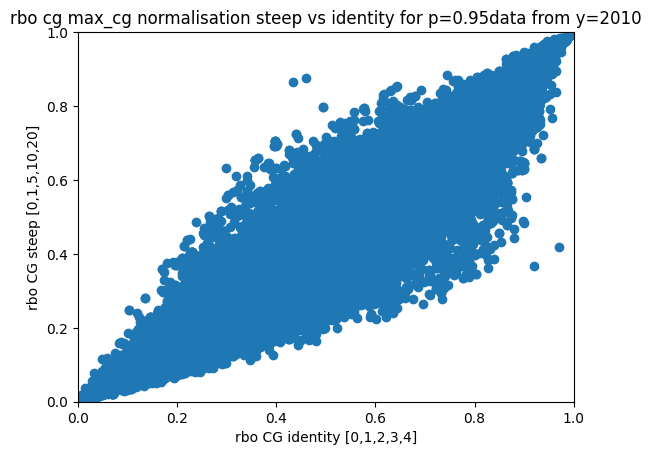

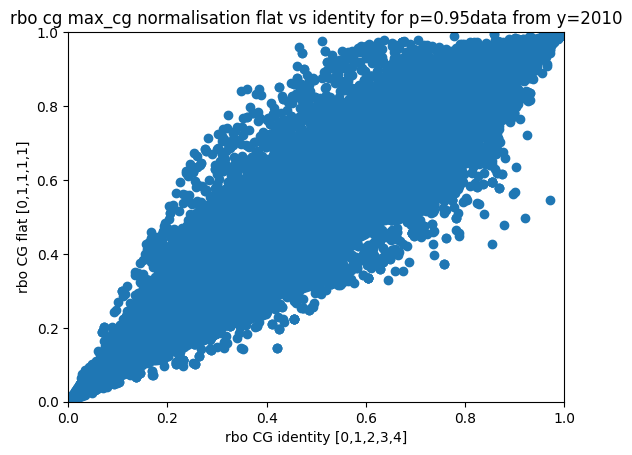

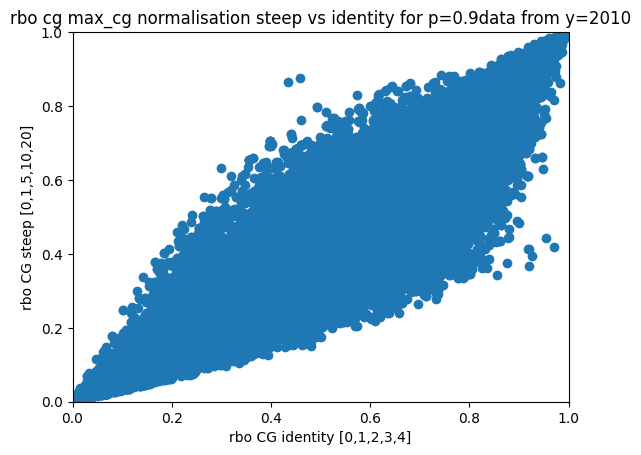

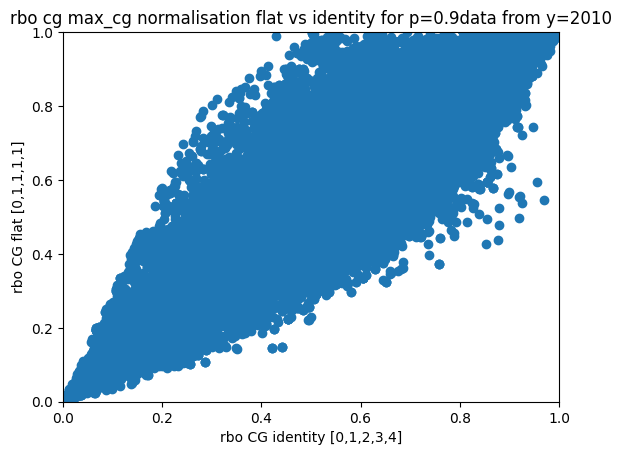

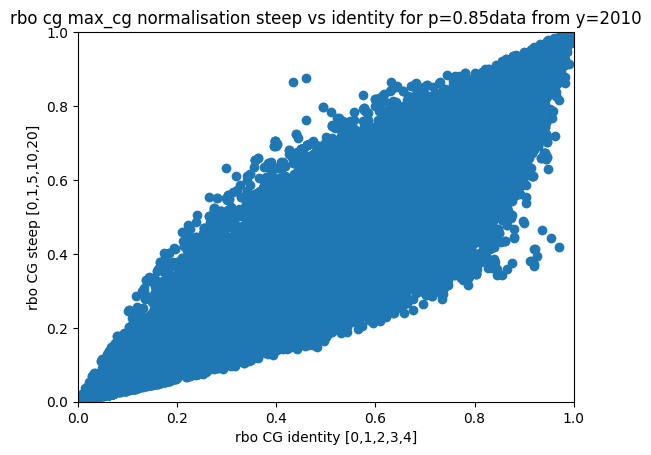

...

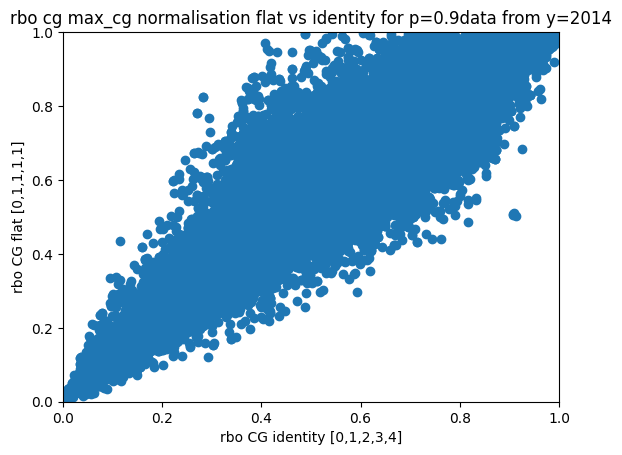

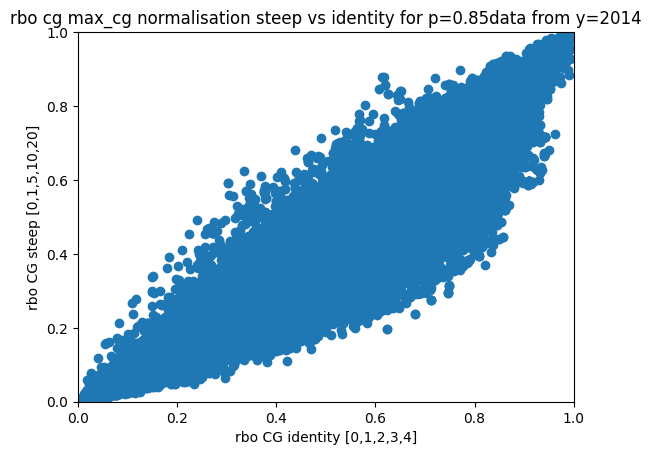

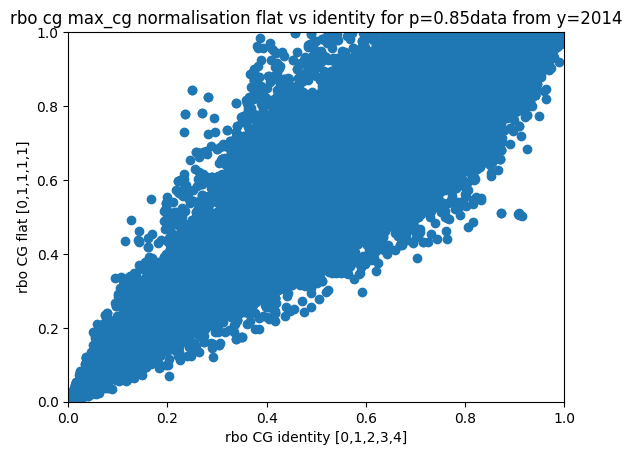

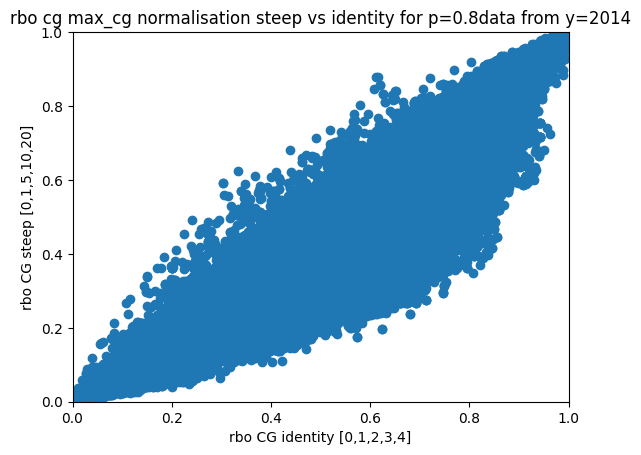

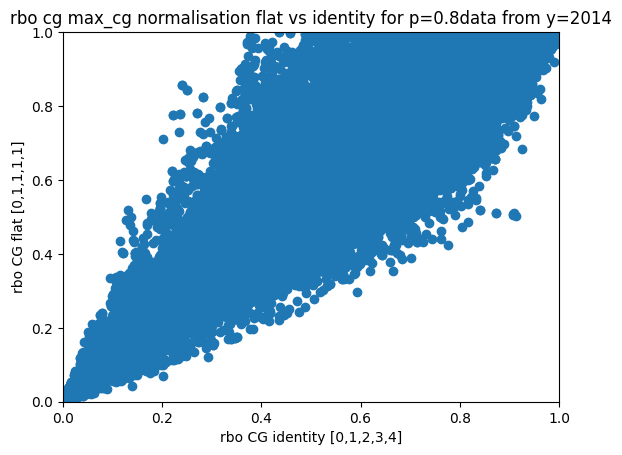

In [50]:
steep_map_values = [0,1,5,10,20]
years = ["2010","2011","2012","2013","2014"]
p_values = [.95,.9,.85,.8]
for year_index in np.arange(0,len(years)):
    y = years[year_index]
    f = []
    for (dirpath, dirnames, filenames) in walk(getcwd()+"/trec-data/runs/"+y):
        f.extend(filenames)
        break

    dfs = []
    for file in f:
        dfs.append(pd.read_csv('trec-data/runs/'+y+'/'+file))

    df_1 = pd.read_csv('trec-data/runs/2014/CiirAll1.csv')
    df_2 = pd.read_csv('trec-data/runs/2014/webisWt14axAll.csv')


    steep_values = []
    base_values = []
    flat_values = []
    steep_values_maxnorm = []
    base_values_maxnorm = []
    flat_values_maxnorm = []
    
    for p in p_values:
        for i in np.arange(0,len(dfs)):
                for j in np.arange(i+1,len(dfs)):
                    for t in np.arange((year_index+1)*50+1,(year_index+2)*50+1):
                        L = dfs[i][dfs[i]['topic']==t]['rel'].tolist()[:100]
                        S = dfs[j][dfs[j]['topic']==t]['rel'].tolist()[:100]

                        steep_values.append(RBO_CG_general(steep_gain(L,steep_map_values),steep_gain(S,steep_map_values),steep_gain([0,1,2,3,4],steep_map_values),p))
                        flat_values.append(RBO_CG_general(flat_gain(L),flat_gain(S),[0,1],p))
                        base_values.append(RBO_CG_general(L,S,[0,1,2,3,4],p))
                        
#                         steep_values_maxnorm.append(RBO_CG_general(steep_gain(L,steep_map_values),steep_gain(S,steep_map_values),steep_gain([0,1,2,3,4],steep_map_values),p,True))
#                         flat_values_maxnorm.append(RBO_CG_general(flat_gain(L),flat_gain(S),[0,1],p,True))
#                         base_values_maxnorm.append(RBO_CG_general(L,S,[0,1,2,3,4],p,True))


        plt.xlim(0, 1)
        plt.ylim(0, 1)

        plt.scatter(base_values, steep_values,, alpha=0.5)
        plt.xlabel('rbo CG identity [0,1,2,3,4]')
        plt.ylabel('rbo CG steep [0,1,5,10,20]')
        plt.title('rbo cg max_cg normalisation steep vs identity for p=' + str(p) + 'data from y='+str(y))

        plt.show()
        
        plt.xlim(0, 1)
        plt.ylim(0, 1)

        plt.scatter(base_values, flat_values, alpha=0.5)
        plt.xlabel('rbo CG identity [0,1,2,3,4]')
        plt.ylabel('rbo CG flat [0,1,1,1,1]')
        plt.title('rbo cg max_cg normalisation flat vs identity for p=' + str(p) + 'data from y='+str(y))

        plt.show()
        
#         plt.scatter(base_values_maxnorm, steep_values_maxnorm)
#         plt.xlabel('rbo CG identity [0,1,2,3,4]')
#         plt.ylabel('rbo CG steep [0,1,5,10,20]')
#         plt.title('rbo cg total max normalisation steep vs identity for p=' + str(p))

#         plt.show()
        
#         plt.xlim(0, 1)
#         plt.ylim(0, 1)

#         plt.scatter(base_values_maxnorm, flat_values_maxnorm)
#         plt.xlabel('rbo CG identity [0,1,2,3,4]')
#         plt.ylabel('rbo CG flat [0,1,1,1,1]')
#         plt.title('rbo cg total max normalisation flat vs identity for p=' + str(p))

#         plt.show()

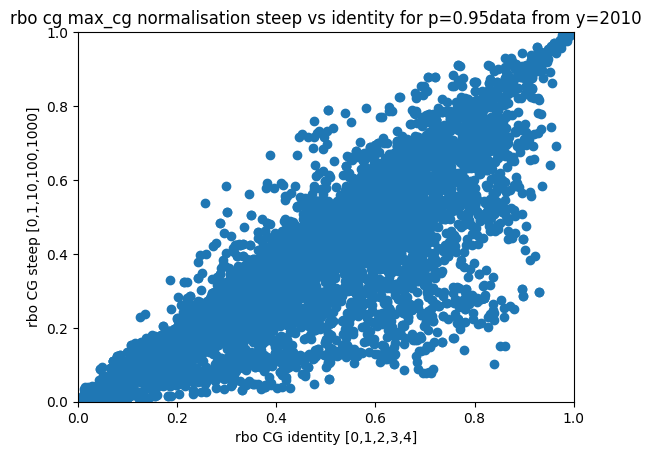

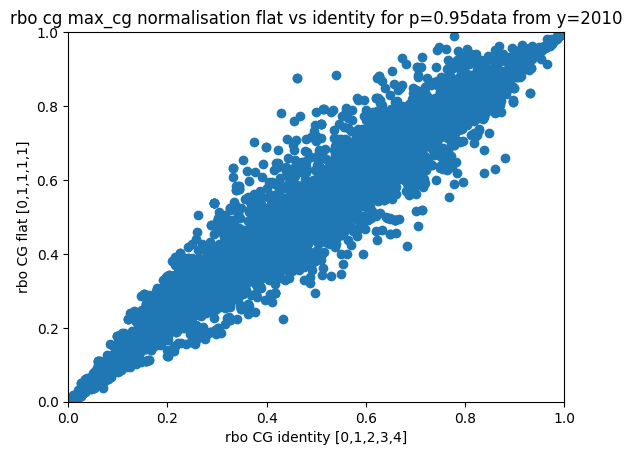

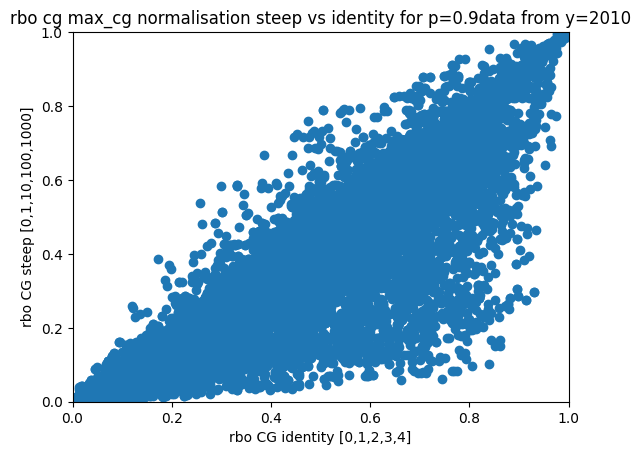

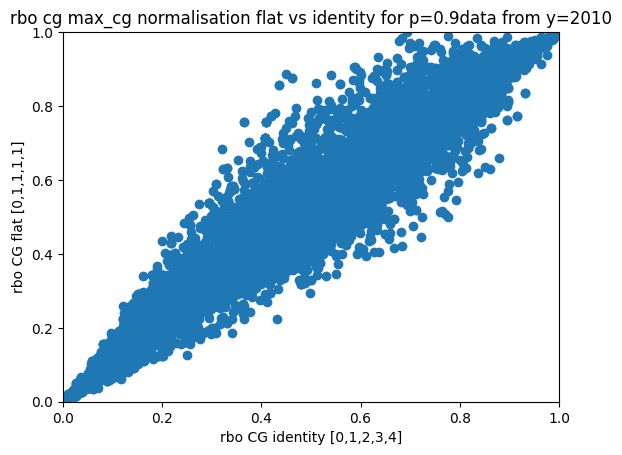

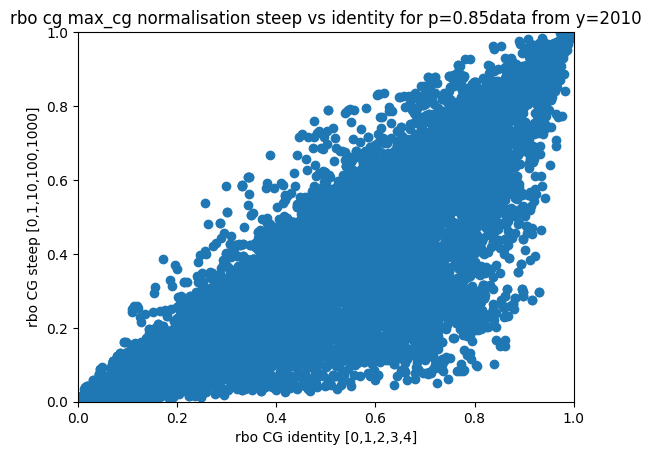

...

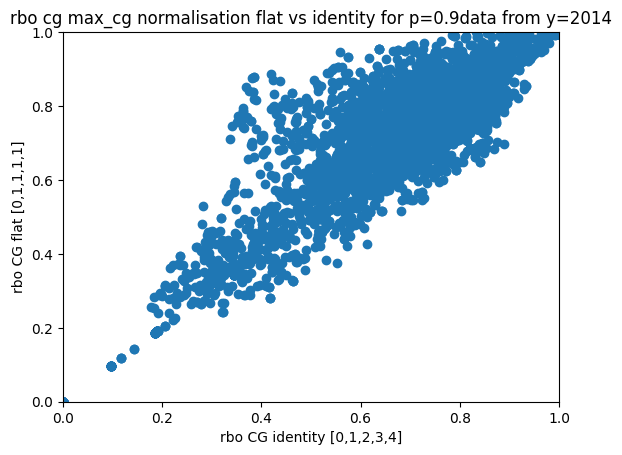

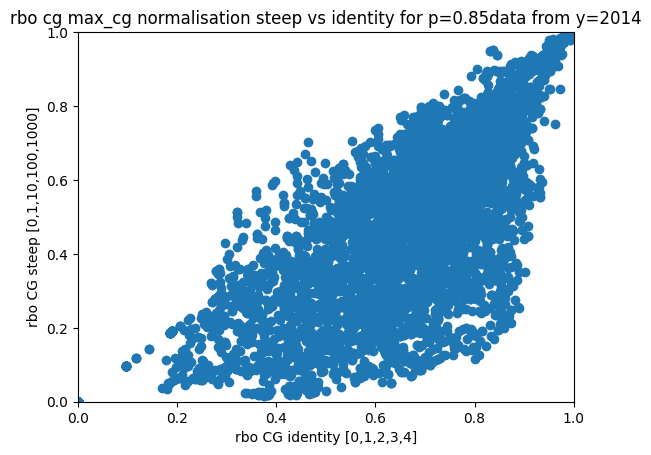

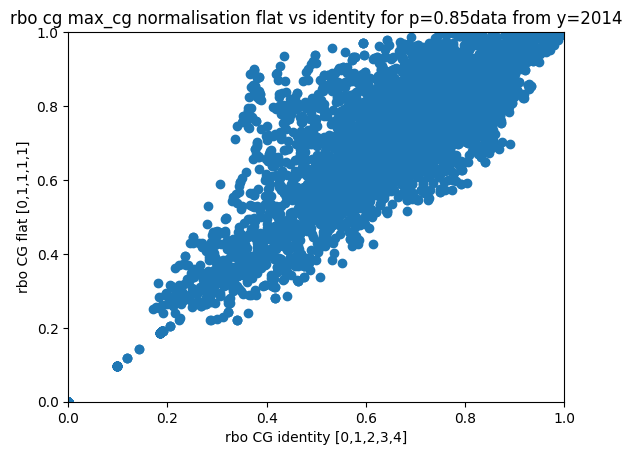

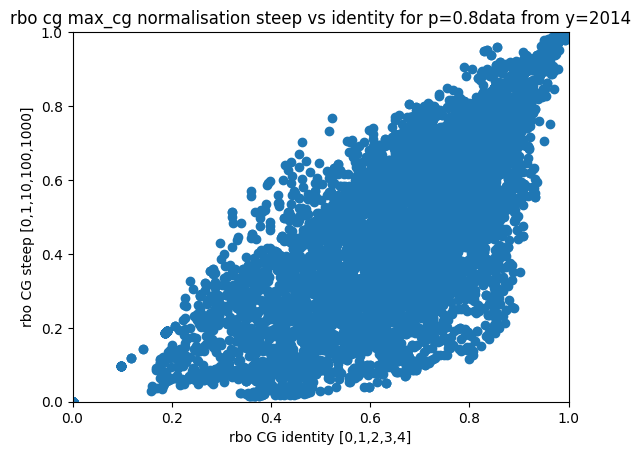

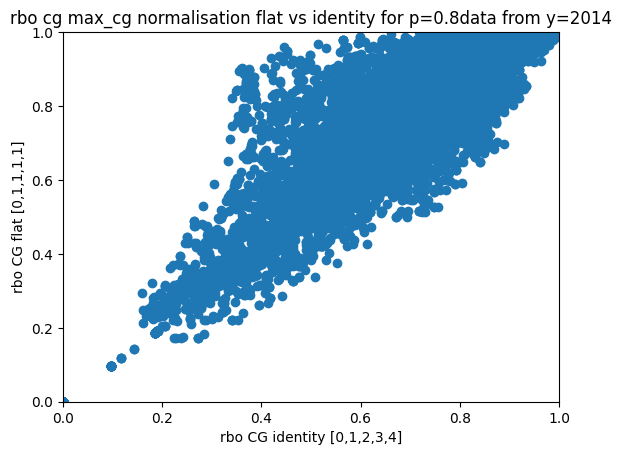

In [4]:
steep_map_values = [0,1,10,100,1000]
years = ["2010","2011","2012","2013","2014"]
p_values = [.95,.9,.85,.8]
for year_index in np.arange(0,len(years)):
    y = years[year_index]
    f = []
    for (dirpath, dirnames, filenames) in walk(getcwd()+"/trec-data/runs/"+y):
        f.extend(filenames)
        break

    dfs = []
    for file in f:
        dfs.append(pd.read_csv('trec-data/runs/'+y+'/'+file))

    df_1 = pd.read_csv('trec-data/runs/2014/CiirAll1.csv')
    df_2 = pd.read_csv('trec-data/runs/2014/webisWt14axAll.csv')


    steep_values = []
    base_values = []
    flat_values = []
    steep_values_maxnorm = []
    base_values_maxnorm = []
    flat_values_maxnorm = []
    
    for p in p_values:
        for i in np.arange(0,len(dfs)):
                for j in np.arange(i+1,len(dfs)):
                    for t in np.arange((year_index+1)*50+1,(year_index+2)*50+1-45):
                        L = dfs[i][dfs[i]['topic']==t]['rel'].tolist()[:100]
                        S = dfs[j][dfs[j]['topic']==t]['rel'].tolist()[:100]

                        steep_values.append(RBO_CG_general(steep_gain(L,steep_map_values),steep_gain(S,steep_map_values),steep_gain([0,1,2,3,4],steep_map_values),p))
                        flat_values.append(RBO_CG_general(flat_gain(L),flat_gain(S),[0,1],p))
                        base_values.append(RBO_CG_general(L,S,[0,1,2,3,4],p))
                        
#                         steep_values_maxnorm.append(RBO_CG_general(steep_gain(L,steep_map_values),steep_gain(S,steep_map_values),steep_gain([0,1,2,3,4],steep_map_values),p,True))
#                         flat_values_maxnorm.append(RBO_CG_general(flat_gain(L),flat_gain(S),[0,1],p,True))
#                         base_values_maxnorm.append(RBO_CG_general(L,S,[0,1,2,3,4],p,True))


        plt.xlim(0, 1)
        plt.ylim(0, 1)

        plt.scatter(base_values, steep_values)
        plt.xlabel('rbo CG identity [0,1,2,3,4]')
        plt.ylabel('rbo CG steep [0,1,10,100,1000]')
        plt.title('rbo cg max_cg normalisation steep vs identity for p=' + str(p) + 'data from y='+str(y))

        plt.show()
        
        plt.xlim(0, 1)
        plt.ylim(0, 1)

        plt.scatter(base_values, flat_values)
        plt.xlabel('rbo CG identity [0,1,2,3,4]')
        plt.ylabel('rbo CG flat [0,1,1,1,1]')
        plt.title('rbo cg max_cg normalisation flat vs identity for p=' + str(p) + 'data from y='+str(y))

        plt.show()
        
#         plt.scatter(base_values_maxnorm, steep_values_maxnorm)
#         plt.xlabel('rbo CG identity [0,1,2,3,4]')
#         plt.ylabel('rbo CG steep [0,1,5,10,20]')
#         plt.title('rbo cg total max normalisation steep vs identity for p=' + str(p))

#         plt.show()
        
#         plt.xlim(0, 1)
#         plt.ylim(0, 1)

#         plt.scatter(base_values_maxnorm, flat_values_maxnorm)
#         plt.xlabel('rbo CG identity [0,1,2,3,4]')
#         plt.ylabel('rbo CG flat [0,1,1,1,1]')
#         plt.title('rbo cg total max normalisation flat vs identity for p=' + str(p))

#         plt.show()

In [46]:
print(RBO_CG_general([1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1],[1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1],[0,1],.8,True))

0.9855884811924146


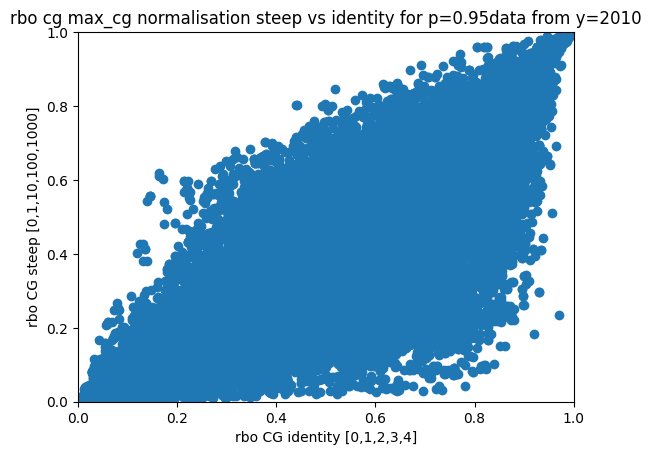

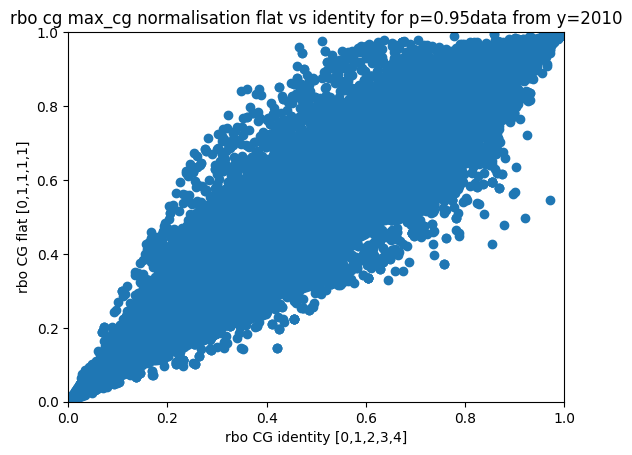

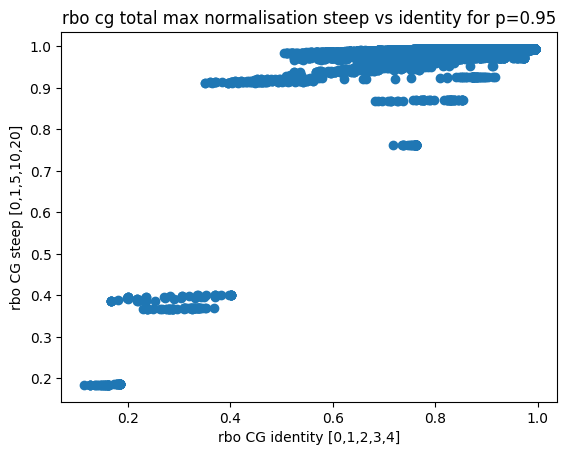

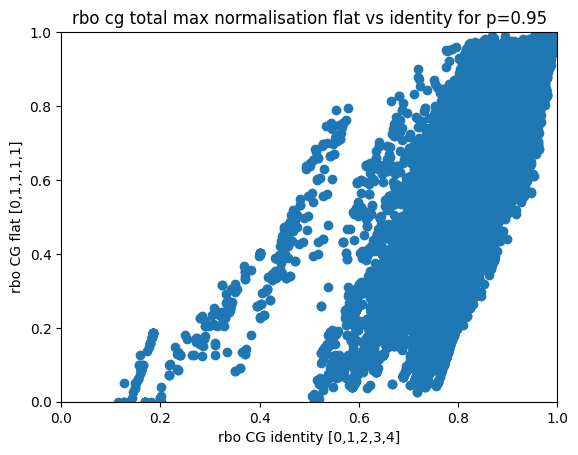

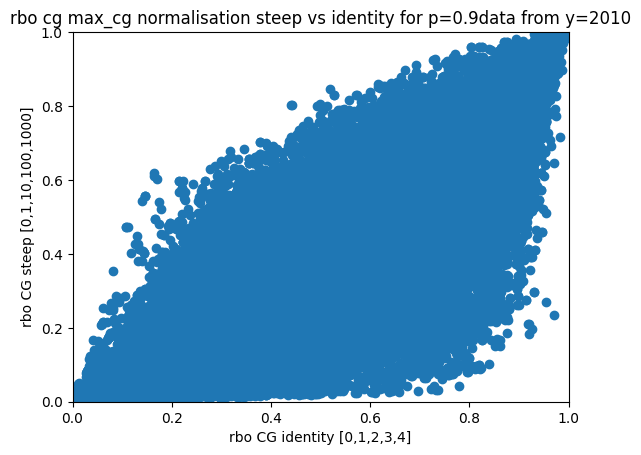

...

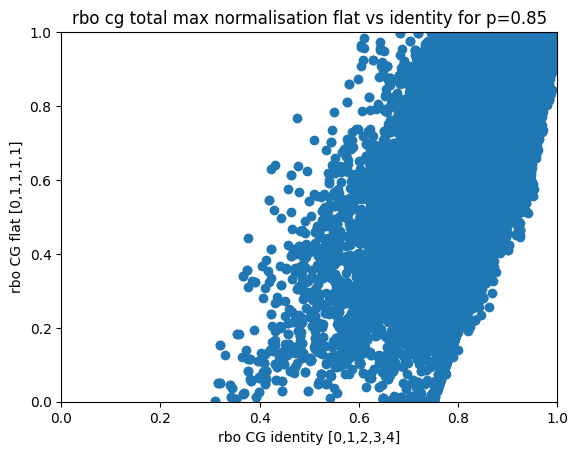

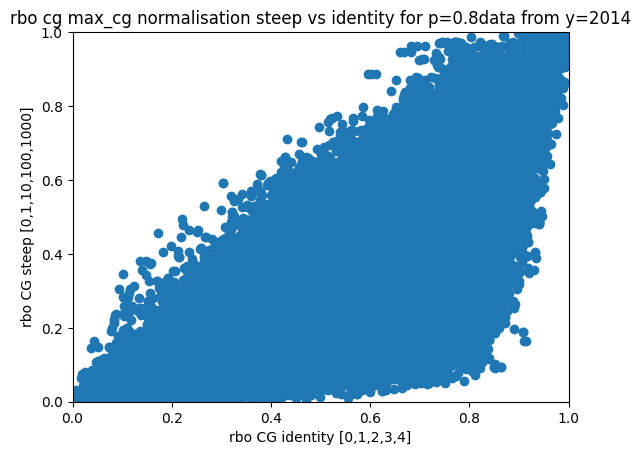

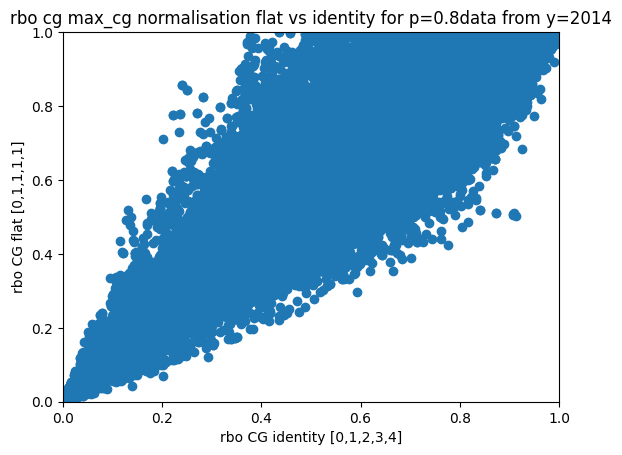

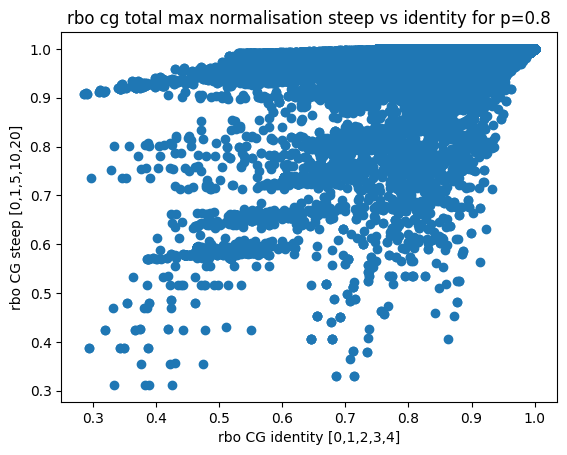

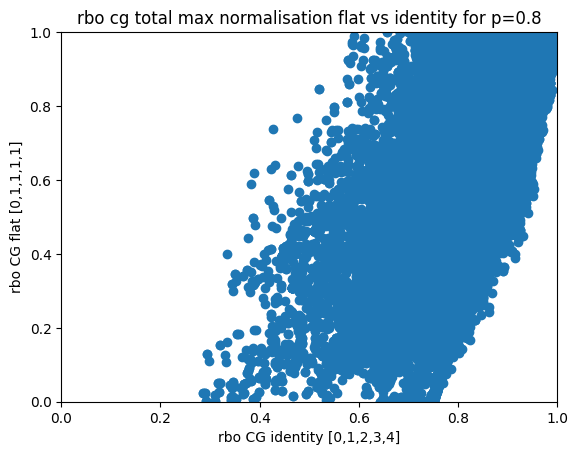

In [8]:
steep_map_values = [0,1,10,100,1000]
years = ["2010","2011","2012","2013","2014"]
p_values = [.95,.9,.85,.8]
for year_index in np.arange(0,len(years)):
    y = years[year_index]
    f = []
    for (dirpath, dirnames, filenames) in walk(getcwd()+"/trec-data/runs/"+y):
        f.extend(filenames)
        break

    dfs = []
    for file in f:
        dfs.append(pd.read_csv('trec-data/runs/'+y+'/'+file))

    df_1 = pd.read_csv('trec-data/runs/2014/CiirAll1.csv')
    df_2 = pd.read_csv('trec-data/runs/2014/webisWt14axAll.csv')


    steep_values = []
    base_values = []
    flat_values = []
    steep_values_maxnorm = []
    base_values_maxnorm = []
    flat_values_maxnorm = []
    
    for p in p_values:
        for i in np.arange(0,len(dfs)):
                for j in np.arange(i+1,len(dfs)):
                    for t in np.arange((year_index+1)*50+1,(year_index+2)*50+1):
                        L = dfs[i][dfs[i]['topic']==t]['rel'].tolist()[:100]
                        S = dfs[j][dfs[j]['topic']==t]['rel'].tolist()[:100]

                        steep_values.append(RBO_CG_general(steep_gain(L,steep_map_values),steep_gain(S,steep_map_values),steep_gain([0,1,2,3,4],steep_map_values),p))
                        flat_values.append(RBO_CG_general(flat_gain(L),flat_gain(S),[0,1],p))
                        base_values.append(RBO_CG_general(L,S,[0,1,2,3,4],p))
                        
                        steep_values_maxnorm.append(RBO_CG_general(steep_gain(L,steep_map_values),steep_gain(S,steep_map_values),steep_gain([0,1,2,3,4],steep_map_values),p,True))
                        flat_values_maxnorm.append(RBO_CG_general(flat_gain(L),flat_gain(S),[0,1],p,True))
                        base_values_maxnorm.append(RBO_CG_general(L,S,[0,1,2,3,4],p,True))


        plt.xlim(0, 1)
        plt.ylim(0, 1)

        plt.scatter(base_values, steep_values)
        plt.xlabel('rbo CG identity [0,1,2,3,4]')
        plt.ylabel('rbo CG steep [0,1,10,100,1000]')
        plt.title('rbo cg max_cg normalisation steep vs identity for p=' + str(p) + 'data from y='+str(y))

        plt.show()
        
        plt.xlim(0, 1)
        plt.ylim(0, 1)

        plt.scatter(base_values, flat_values)
        plt.xlabel('rbo CG identity [0,1,2,3,4]')
        plt.ylabel('rbo CG flat [0,1,1,1,1]')
        plt.title('rbo cg max_cg normalisation flat vs identity for p=' + str(p) + 'data from y='+str(y))

        plt.show()
        
        plt.scatter(base_values_maxnorm, steep_values_maxnorm)
        plt.xlabel('rbo CG identity [0,1,2,3,4]')
        plt.ylabel('rbo CG steep [0,1,10,100,1000]')
        plt.title('rbo cg total max normalisation steep vs identity for p=' + str(p))

        plt.show()
        
        plt.xlim(0, 1)
        plt.ylim(0, 1)

        plt.scatter(base_values_maxnorm, flat_values_maxnorm)
        plt.xlabel('rbo CG identity [0,1,2,3,4]')
        plt.ylabel('rbo CG flat [0,1,1,1,1]')
        plt.title('rbo cg total max normalisation flat vs identity for p=' + str(p))

        plt.show()

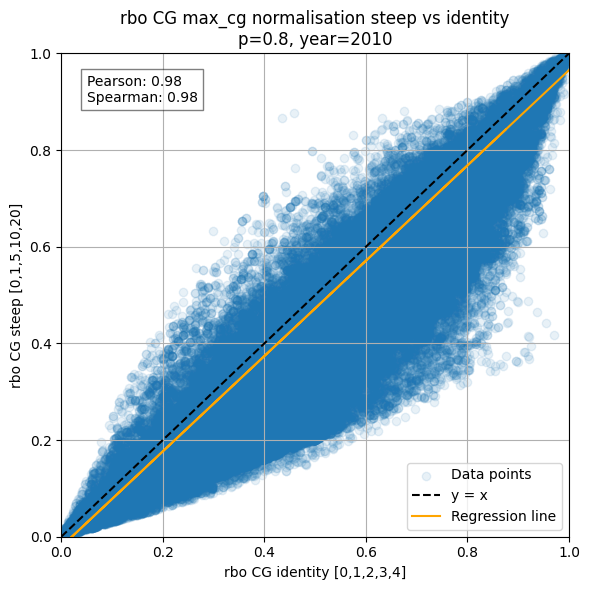

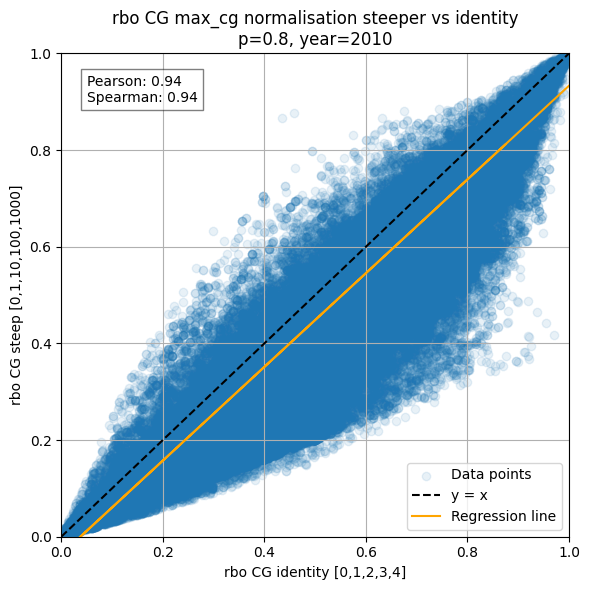

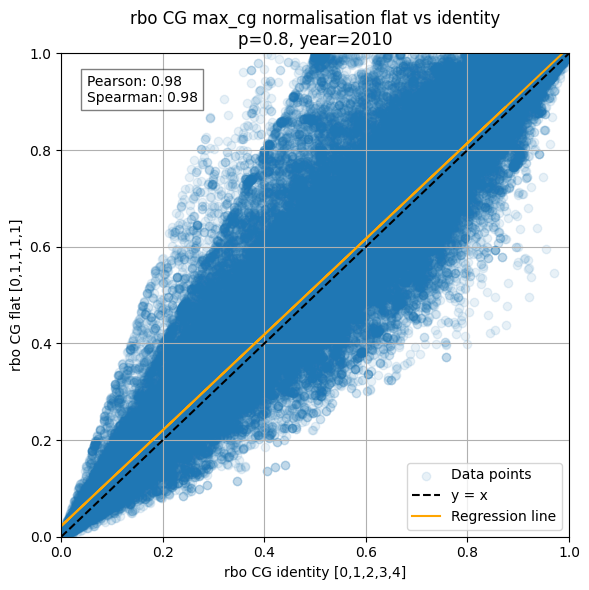

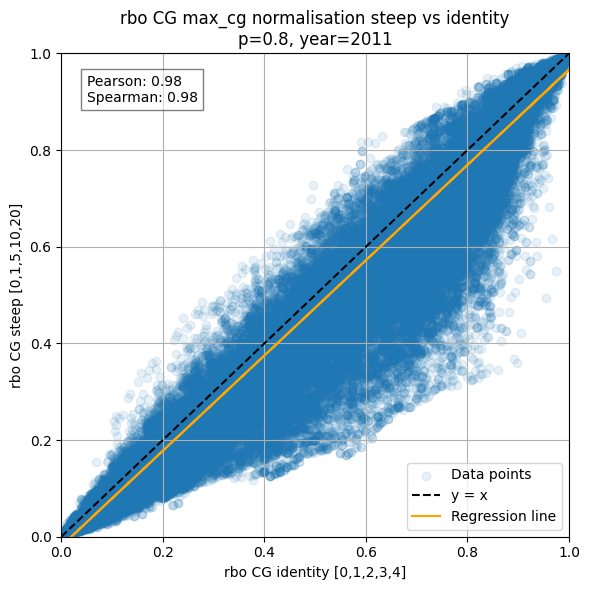

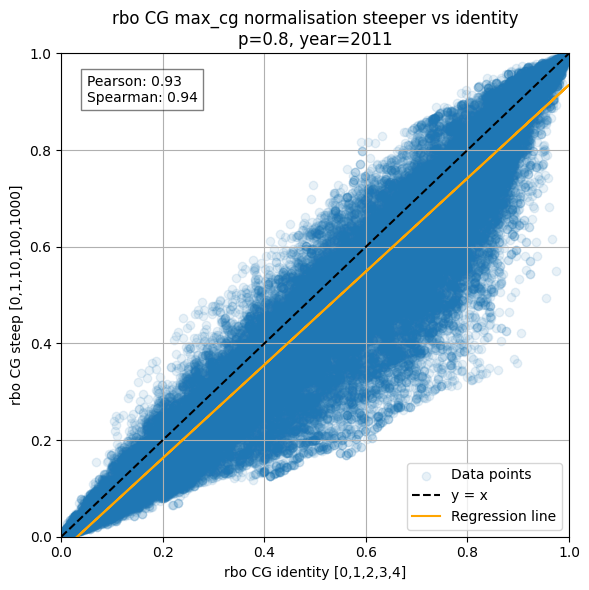

...

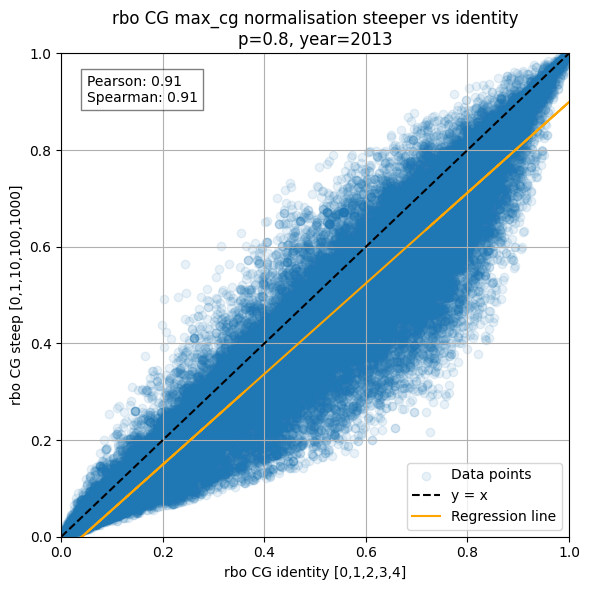

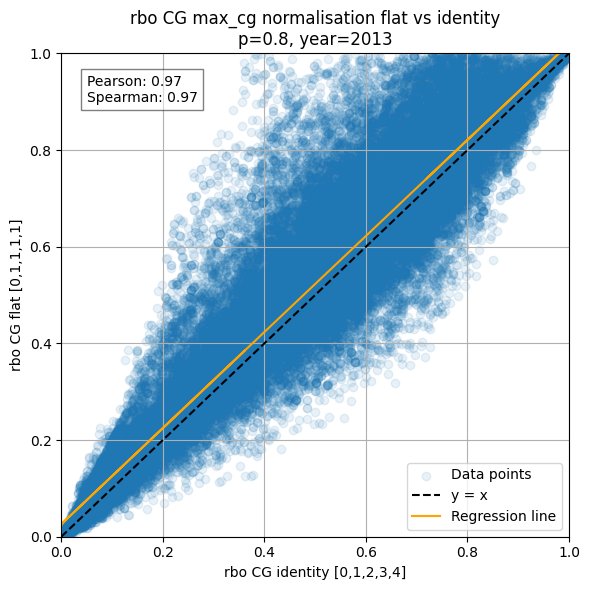

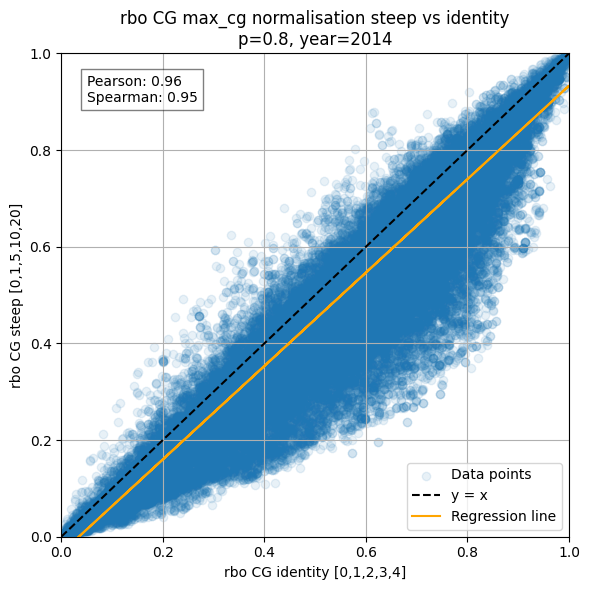

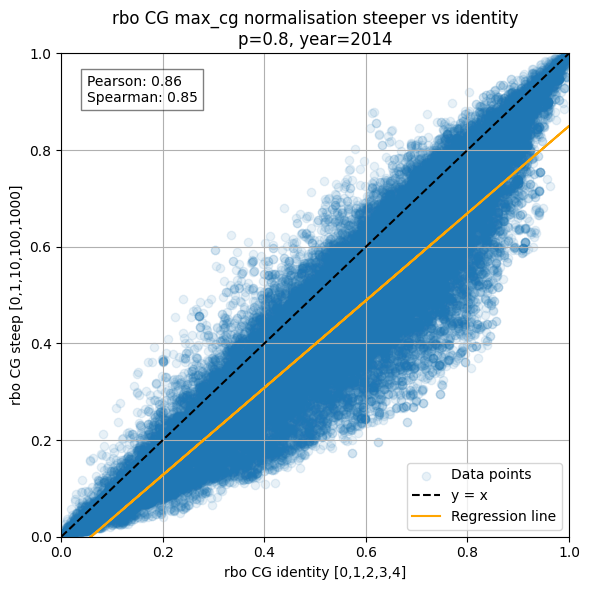

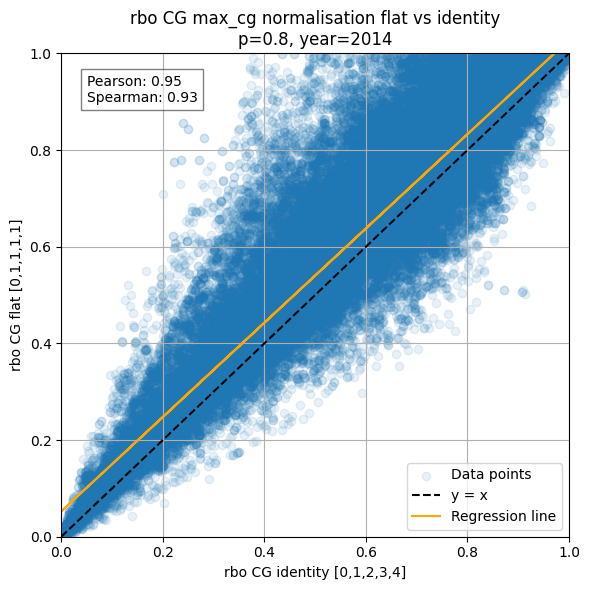

In [14]:
steep_map_values = [0,1,5,10,20]
steeper_map_values = [0,1,10,100,1000]
years = ["2010","2011","2012","2013","2014"]
p_values = [.95,.9,.85,.8]
for year_index in np.arange(0,len(years)):
    y = years[year_index]
    f = []
    for (dirpath, dirnames, filenames) in walk(getcwd()+"/trec-data/runs/"+y):
        f.extend(filenames)
        break

    dfs = []
    for file in f:
        dfs.append(pd.read_csv('trec-data/runs/'+y+'/'+file))

    df_1 = pd.read_csv('trec-data/runs/2014/CiirAll1.csv')
    df_2 = pd.read_csv('trec-data/runs/2014/webisWt14axAll.csv')


    steep_values = []
    steeper_values = []
    base_values = []
    flat_values = []
    steep_values_maxnorm = []
    base_values_maxnorm = []
    flat_values_maxnorm = []
    
    for p in p_values:
        for i in np.arange(0,len(dfs)):
                for j in np.arange(i+1,len(dfs)):
                    for t in np.arange((year_index+1)*50+1,(year_index+2)*50+1):
                        L = dfs[i][dfs[i]['topic']==t]['rel'].tolist()[:100]
                        S = dfs[j][dfs[j]['topic']==t]['rel'].tolist()[:100]

                        steep_values.append(RBO_CG_general(steep_gain(L,steep_map_values),steep_gain(S,steep_map_values),steep_gain([0,1,2,3,4],steep_map_values),p))
                        steeper_values.append(RBO_CG_general(steep_gain(L,steeper_map_values),steep_gain(S,steeper_map_values),steep_gain([0,1,2,3,4],steeper_map_values),p))
                        flat_values.append(RBO_CG_general(flat_gain(L),flat_gain(S),[0,1],p))
                        base_values.append(RBO_CG_general(L,S,[0,1,2,3,4],p))
                        
#                         steep_values_maxnorm.append(RBO_CG_general(steep_gain(L,steep_map_values),steep_gain(S,steep_map_values),steep_gain([0,1,2,3,4],steep_map_values),p,True))
#                         flat_values_maxnorm.append(RBO_CG_general(flat_gain(L),flat_gain(S),[0,1],p,True))
#                         base_values_maxnorm.append(RBO_CG_general(L,S,[0,1,2,3,4],p,True))


    # Calculate correlations
    pearson_corr, _ = pearsonr(base_values, steep_values)
    spearman_corr, _ = spearmanr(base_values, steep_values)

    # Regression line
    m, b = np.polyfit(base_values, steep_values, 1)
    reg_line = [m * x + b for x in base_values]

    plt.figure(figsize=(6, 6))
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.scatter(base_values, steep_values, alpha=0.1, label='Data points')
    plt.plot([0, 1], [0, 1], 'k--', label='y = x')
    plt.plot(base_values, reg_line, color='orange', label='Regression line')

    plt.xlabel('rbo CG identity [0,1,2,3,4]')
    plt.ylabel('rbo CG steep [0,1,5,10,20]')
    plt.title(f'rbo CG max_cg normalisation steep vs identity\np={p}, year={y}')
    plt.legend()
    plt.grid(True)
    plt.text(0.05, 0.9, f'Pearson: {pearson_corr:.2f}\nSpearman: {spearman_corr:.2f}',
             transform=plt.gca().transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.5))
    plt.tight_layout()
    plt.show()
    
    # Calculate correlations
    pearson_corr, _ = pearsonr(base_values, steeper_values)
    spearman_corr, _ = spearmanr(base_values, steeper_values)

    # Regression line
    m, b = np.polyfit(base_values, steeper_values, 1)
    reg_line = [m * x + b for x in base_values]

    plt.figure(figsize=(6, 6))
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.scatter(base_values, steep_values, alpha=0.1, label='Data points')
    plt.plot([0, 1], [0, 1], 'k--', label='y = x')
    plt.plot(base_values, reg_line, color='orange', label='Regression line')

    plt.xlabel('rbo CG identity [0,1,2,3,4]')
    plt.ylabel('rbo CG steep [0,1,10,100,1000]')
    plt.title(f'rbo CG max_cg normalisation steeper vs identity\np={p}, year={y}')
    plt.legend()
    plt.grid(True)
    plt.text(0.05, 0.9, f'Pearson: {pearson_corr:.2f}\nSpearman: {spearman_corr:.2f}',
             transform=plt.gca().transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.5))
    plt.tight_layout()
    plt.show()

    pearson_corr, _ = pearsonr(base_values, flat_values)
    spearman_corr, _ = spearmanr(base_values, flat_values)

    # Regression line
    m, b = np.polyfit(base_values, flat_values, 1)
    reg_line = [m * x + b for x in base_values]

    plt.figure(figsize=(6, 6))
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.scatter(base_values, flat_values, alpha=0.1, label='Data points')
    plt.plot([0, 1], [0, 1], 'k--', label='y = x')
    plt.plot(base_values, reg_line, color='orange', label='Regression line')

    plt.xlabel('rbo CG identity [0,1,2,3,4]')
    plt.ylabel('rbo CG flat [0,1,1,1,1]')
    plt.title(f'rbo CG max_cg normalisation flat vs identity\np={p}, year={y}')
    plt.legend()
    plt.grid(True)
    plt.text(0.05, 0.9, f'Pearson: {pearson_corr:.2f}\nSpearman: {spearman_corr:.2f}',
             transform=plt.gca().transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.5))
    plt.tight_layout()
    plt.show()
        
#         plt.scatter(base_values_maxnorm, steep_values_maxnorm)
#         plt.xlabel('rbo CG identity [0,1,2,3,4]')
#         plt.ylabel('rbo CG steep [0,1,5,10,20]')
#         plt.title('rbo cg total max normalisation steep vs identity for p=' + str(p))

#         plt.show()
        
#         plt.xlim(0, 1)
#         plt.ylim(0, 1)

#         plt.scatter(base_values_maxnorm, flat_values_maxnorm)
#         plt.xlabel('rbo CG identity [0,1,2,3,4]')
#         plt.ylabel('rbo CG flat [0,1,1,1,1]')
#         plt.title('rbo cg total max normalisation flat vs identity for p=' + str(p))

#         plt.show()

In [35]:
starting_values = {0,100,10000,1000000}
current_values = starting_values.copy()

def fact(p):
    if p>1:
        return p*fact(p-1)
    return 1

for x in np.arange(0,10):
    print(fact(x+len(starting_values))/(fact(x+1)*(fact(len(starting_values)-1))))
    next_values = set()
    print(len(current_values))
    for s in current_values:
        for sv in starting_values:
            next_values.add(s+sv)
    
    current_values = next_values



4.0
4
10.0
10
20.0
20
35.0
35
56.0
56
84.0
84
120.0
120
165.0
165
220.0
220
88.7370252792475
286


C:\Users\Thijs\AppData\Local\Temp\ipykernel_27404\186024449.py:6: RuntimeWarning: overflow encountered in scalar multiply
  return p*fact(p-1)
